# AJ_0069.1 - Schiebinger data preparation

**Runs with conda env: R_scRNAseq**

Data was initially downloaded and merged (but not processed) by Joel Chappel, who handed me the corresponding rds files.  



In [1]:
setwd("/staging/leuven/stg_00041/Adrian/TALON_JANISZEWSKI_XCR2/")

In [2]:
suppressPackageStartupMessages({
    library(Seurat)
    library(dplyr)
    library(readr)
    library(scater)
    library(SingleCellExperiment)
    library(tidyr)
    library(viridis)
})

Warning message:
"package 'Seurat' was built under R version 3.6.2"Warning message:
"package 'matrixStats' was built under R version 3.6.2"

In [3]:
annotation <- readRDS("Schiebinger_integration/raw_data/annotation.rds")
counts <- readRDS("Schiebinger_integration/raw_data/Schiebinger_merged.rds")

In [4]:
Schiebinger_seurat <- CreateSeuratObject(counts = counts, project = "Schiebinger", meta.data = annotation)

In [5]:
Schiebinger_seurat

An object of class Seurat 
19130 features across 316984 samples within 1 assay 
Active assay: RNA (19130 features)

In [6]:
# This data contains two sequencing experiments published in Schiebinger et al., 
# I decided to focus on the bigger one and later it will be subsampled randomly to 50k cells.

Schiebinger_objects <- SplitObject(Schiebinger_seurat, split.by = "Experiment")

In [7]:
# Select dataset with over 250k cells
Schiebinger_big <- Schiebinger_objects[["GSE115943"]]

In [8]:
Schiebinger_big

An object of class Seurat 
19130 features across 251203 samples within 1 assay 
Active assay: RNA (19130 features)

In [9]:
Schiebinger_big <- FindVariableFeatures(Schiebinger_big, selection.method = "vst", nfeatures = 2000)
all.genes <- rownames(Schiebinger_big)

In [10]:
Schiebinger_big <- ScaleData(Schiebinger_big, features = all.genes)

Centering and scaling data matrix


In [11]:
Schiebinger_big <- RunPCA(Schiebinger_big, features = VariableFeatures(object = Schiebinger_big))

PC_ 1 
Positive:  Npm1, Hmgb2, Chchd10, 2700094K13Rik, Ran, Slc25a5, Nhp2, Dctpp1, Bex1, Hspe1 
	   Set, Ptma, Mkrn1, Mybl2, Rpl12, Ube2s, Fkbp3, Tomm20, Cacybp, Dpy30 
	   Mylpf, Ube2c, Ncl, Cox5a, Bex4, Fkbp4, Eif2s2, Nap1l1, Ranbp1, Tdgf1 
Negative:  Col1a1, Col1a2, Sparc, Aebp1, Bgn, Lgals1, Timp2, Cald1, Thbs1, Serpinh1 
	   Col3a1, Col5a2, Mmp2, B2m, Fstl1, Mxra8, Lox, Pcolce, Timp3, Gabarap 
	   Cnn2, Col5a1, Cyp1b1, Mmp14, S100a11, Prss23, Lrp1, Col8a1, Xist, Tmem176b 
PC_ 2 
Positive:  Cd109, Aldh3a1, Cd24a, Hmgn3, Avpi1, Ccnd1, S100a10, Ppic, Actg2, Dusp14 
	   Tm4sf1, 2810417H13Rik, Ybx3, Pllp, Limd2, Id1, Pcolce2, Pfn1, Ptrf, Grb10 
	   Slc25a4, Ramp3, Nme1, Myc, Dpysl3, Ociad2, Nme2, Gm10073, Tomm5, Nop10 
Negative:  Fabp3, Dusp9, Cstb, Rhox5, Rhox6, Apoe, Rhox9, Krt7, Apoc1, S100a13 
	   Bex1, Syngr1, Cldn4, Dkkl1, Npc2, Cystm1, Ctsl, Spp1, Trap1a, AA467197 
	   Taf7, Peg10, Psap, Mylpf, Mdk, Gabarapl2, Tdgf1, Chchd10, Eps8l2, Ctsb 
PC_ 3 
Positive:  Krt8, Krt19, Peg10, N

In [12]:
Schiebinger_big@meta.data$project <- "Schiebinger"

In [13]:
# Takes long to compute for that many samples (~ 15 minutes)

Schiebinger_big <- RunUMAP(Schiebinger_big, dims = 1:20)

Warning message:
"The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session"17:16:45 UMAP embedding parameters a = 0.9922 b = 1.112
17:16:45 Read 251203 rows and found 20 numeric columns
17:16:45 Using Annoy for neighbor search, n_neighbors = 30
17:16:45 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
17:17:26 Writing NN index file to temp file /tmp/RtmpWaS13u/file20443231b57
17:17:26 Searching Annoy index using 1 thread, search_k = 3000
17:19:17 Annoy recall = 100%
17:19:18 Commencing smooth kNN distance calibration using 1 thread
17:19:32 Initializing from normalized Laplacian + noise
17:20:02 Commencing optimizati

Warning message:
"Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session."

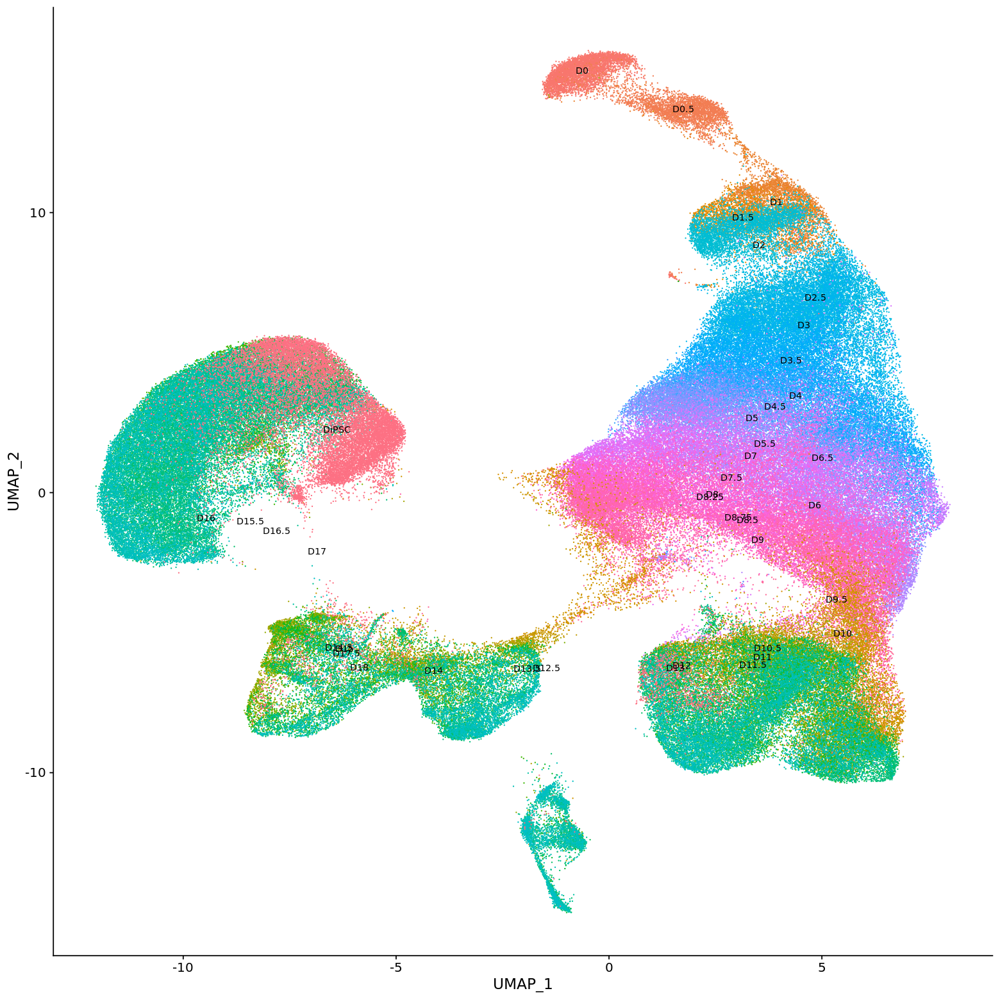

In [15]:
options(repr.plot.width = 13, repr.plot.height = 13)
DimPlot(Schiebinger_big, reduction = "umap",repel = F,label.size = 3, label = TRUE, pt.size = 0.01) + NoLegend()

In [16]:
Schiebinger_big <- FindNeighbors(Schiebinger_big, dims = 1:20)
Schiebinger_big <- FindClusters(Schiebinger_big, resolution = 0.5)

Computing nearest neighbor graph
Computing SNN


Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 251203
Number of edges: 7281726

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9220
Number of communities: 21
Elapsed time: 213 seconds


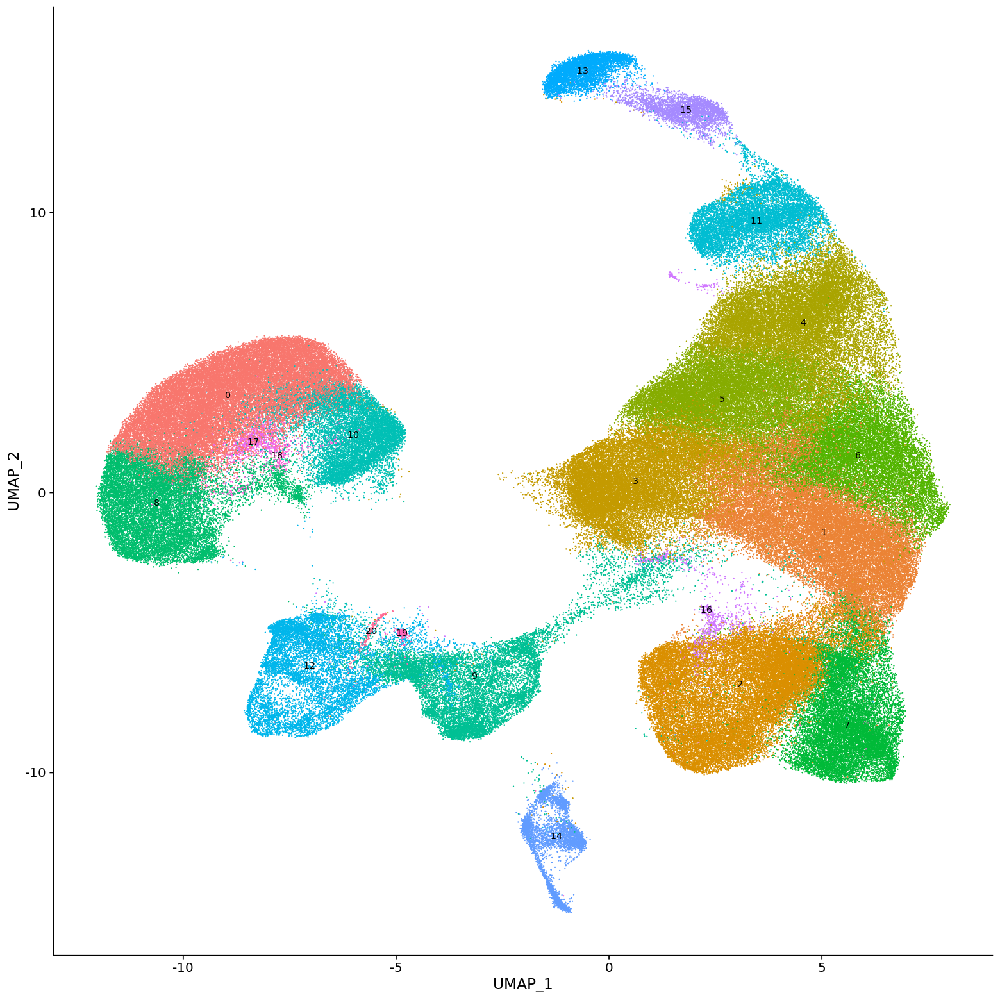

In [17]:
DimPlot(Schiebinger_big, reduction = "umap",repel = F,label.size = 3, label = TRUE, pt.size = 0.01) + NoLegend()

In [18]:
# find markers for every cluster compared to all remaining cells, report only the positive ones
Schiebinger_big.markers <- FindAllMarkers(Schiebinger_big, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25)
Schiebinger_big.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)

Calculating cluster 0


In [ ]:
top10 <- Schiebinger_big.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
pdf("Schiebinger_markers_top10.pdf", useDingbats=FALSE, height = 30, width = 30)
DoHeatmap(Schiebinger_big, features = top10$gene) + NoLegend()
dev.off()

In [19]:
# Takes very long to save and ends up quite big as well

saveRDS(Schiebinger_big, "Schiebinger_integration/Schiebinger_big_clustered.rds")

In [20]:
getwd()

[1] "/lustre1/project/stg_00041/Adrian/TALON_JANISZEWSKI_XCR2"

## Sample the object to reduce the number of cells from 250k to around 100k

In [21]:
set.seed(1234)
Schiebinger_big.downsample <- subset(Schiebinger_big, cells = sample(Cells(Schiebinger_big), 50000))

In [22]:
Schiebinger_big.downsample

An object of class Seurat 
19130 features across 50000 samples within 1 assay 
Active assay: RNA (19130 features)
 2 dimensional reductions calculated: pca, umap

In [23]:
Schiebinger_big.downsample <- FindVariableFeatures(Schiebinger_big.downsample, selection.method = "vst", nfeatures = 2000)
all.genes <- rownames(Schiebinger_big.downsample)
Schiebinger_big.downsample <- ScaleData(Schiebinger_big.downsample, features = all.genes)
Schiebinger_big.downsample <- RunPCA(Schiebinger_big.downsample, features = VariableFeatures(object = Schiebinger_big.downsample))

Centering and scaling data matrix
PC_ 1 
Positive:  Npm1, Hmgb2, Chchd10, 2700094K13Rik, Ran, Slc25a5, Dctpp1, Nhp2, Bex1, Hspe1 
	   Ptma, Set, Mkrn1, Rpl12, Mybl2, Ube2s, Tomm20, Fkbp3, Cacybp, Ube2c 
	   Mylpf, Cox5a, Ncl, Nap1l1, Bex4, Fkbp4, Ranbp1, Lyar, Eif2s2, Hnrnpa1 
Negative:  Col1a1, Col1a2, Sparc, Aebp1, Bgn, Lgals1, Timp2, Cald1, Col3a1, Thbs1 
	   Serpinh1, Col5a2, Mmp2, B2m, Fstl1, Mxra8, Lox, Pcolce, Col5a1, Timp3 
	   Gabarap, Cnn2, Cyp1b1, Mmp14, Prss23, Lrp1, S100a11, Col8a1, Col6a1, Tmem176b 
PC_ 2 
Positive:  Fabp3, Dusp9, Rhox5, Cstb, Rhox6, Apoe, Rhox9, S100a13, Apoc1, Krt7 
	   Bex1, Syngr1, Npc2, Spp1, Trap1a, Dkkl1, AA467197, Ctsl, Cystm1, Mylpf 
	   Cldn4, Taf7, Mdk, Peg10, Chchd10, Psap, Tdgf1, Gabarapl2, Ooep, Slc2a3 
Negative:  Cd109, Aldh3a1, Cd24a, Hmgn3, Avpi1, Ccnd1, S100a10, Ppic, Dusp14, Actg2 
	   Ybx3, Tm4sf1, 2810417H13Rik, Ptrf, Pcolce2, Pfn1, Limd2, Id1, Grb10, Slc25a4 
	   Ramp3, Myc, Nme1, Dpysl3, Ociad2, Tomm5, Gm10073, Anxa8, Nop10, Nme2 
P

In [24]:
Schiebinger_big.downsample <- RunUMAP(Schiebinger_big.downsample, dims = 1:20, min.dist = 0.3)

18:30:40 UMAP embedding parameters a = 0.9922 b = 1.112
18:30:40 Read 50000 rows and found 20 numeric columns
18:30:40 Using Annoy for neighbor search, n_neighbors = 30
18:30:40 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
18:30:53 Writing NN index file to temp file /tmp/RtmpWaS13u/file204420811f06
18:30:53 Searching Annoy index using 1 thread, search_k = 3000
18:31:14 Annoy recall = 100%
18:31:16 Commencing smooth kNN distance calibration using 1 thread
18:31:19 Initializing from normalized Laplacian + noise
18:31:22 Commencing optimization for 200 epochs, with 2095720 positive edges
18:32:20 Optimization finished


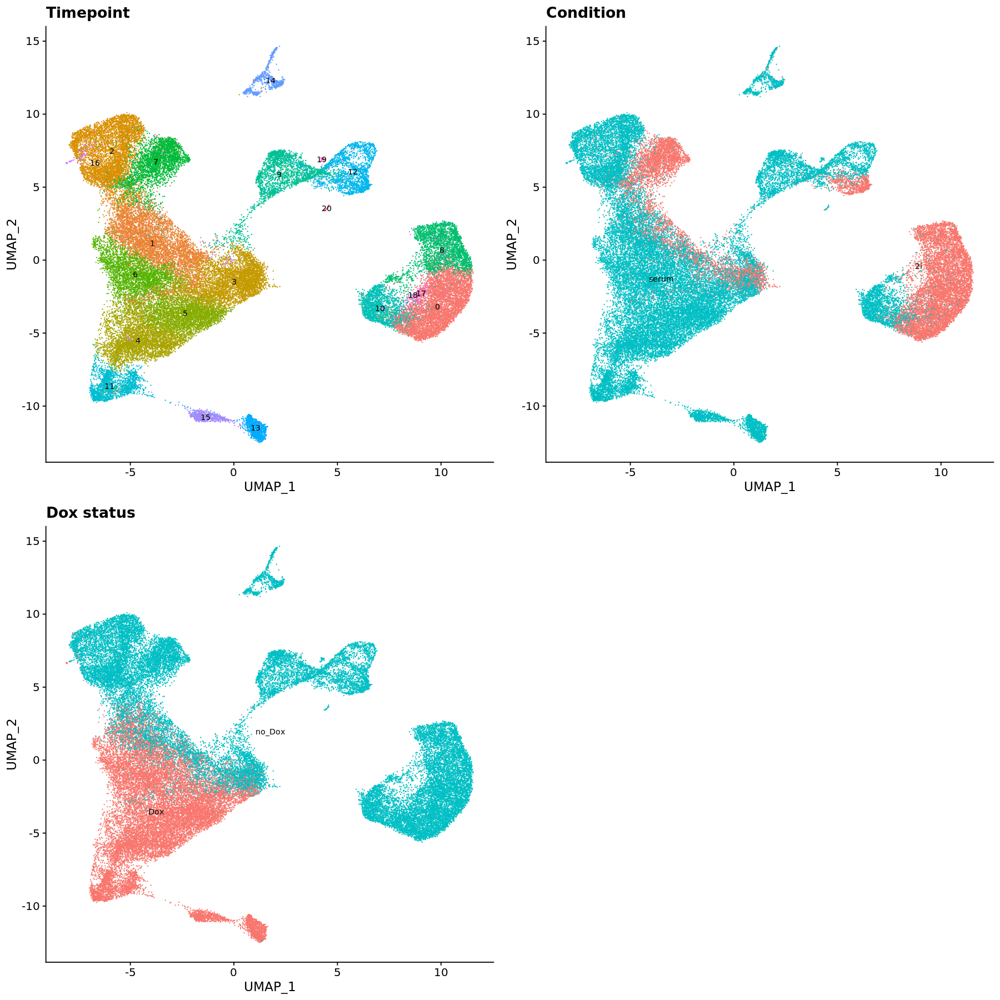

In [25]:
options(repr.plot.width = 15, repr.plot.height = 15)
p1 <- DimPlot(Schiebinger_big.downsample, reduction = "umap", repel = F,label.size = 3, label = TRUE, pt.size = 0.01) + NoLegend() + ggtitle("Timepoint")
p2 <- DimPlot(Schiebinger_big.downsample, reduction = "umap", group.by = "condition",repel = F,label.size = 3, label = TRUE, pt.size = 0.01) + NoLegend() + ggtitle("Condition")
p3 <- DimPlot(Schiebinger_big.downsample, reduction = "umap", group.by = "Dox_status",repel = F,label.size = 3, label = TRUE, pt.size = 0.01) + NoLegend()+ ggtitle("Dox status")
CombinePlots(
  plots = list(p1, p2, p3))

In [26]:
Schiebinger_big.downsample@meta.data$project <- "Schiebinger"

In [27]:
head(Schiebinger_big.downsample@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,cell_ID,time_point,cell_number,Experiment,condition,Dox_status,project,RNA_snn_res.0.5,seurat_clusters
DiPSC_2i_C1_CCATGTCAGACTAGGC-1,DiPSC,3113.147,3137,DiPSC_2i_C1_CCATGTCAGACTAGGC-1,DiPSC,2i,GSE115943,2i,no_Dox,Schiebinger,0,0
D8.5_2i_C1_CGGACTGGTAATTGGA-1,D8.5,3034.758,3228,D8.5_2i_C1_CGGACTGGTAATTGGA-1,D8_5,2i,GSE115943,2i,no_Dox,Schiebinger,3,3
D4_Dox_C1_AGAGCTTCAGGAATGC-1,D4,3158.778,3363,D4_Dox_C1_AGAGCTTCAGGAATGC-1,D4,Dox,GSE115943,serum,Dox,Schiebinger,4,4
D12.5_2i_C1_GTCTTCGGTGACGGTA-1,D12.5,3464.387,3863,D12.5_2i_C1_GTCTTCGGTGACGGTA-1,D12_5,2i,GSE115943,2i,no_Dox,Schiebinger,12,12
D3_Dox_C2_TCTGGAAAGCTGCGAA-1,D3,3299.385,3772,D3_Dox_C2_TCTGGAAAGCTGCGAA-1,D3,Dox,GSE115943,serum,Dox,Schiebinger,4,4
D18_2i_C2_TGCACCTTCTTCTGGC-1,D18,2358.662,2562,D18_2i_C2_TGCACCTTCTTCTGGC-1,D18,2i,GSE115943,2i,no_Dox,Schiebinger,7,7


In [28]:
saveRDS(Schiebinger_big.downsample, "Schiebinger_integration/Schiebinger_big_downsample.rds")

In [3]:
Schiebinger_big.downsample <- readRDS("Schiebinger_integration/Schiebinger_big_downsample.rds")

## Import 10X data

In [4]:
TENX_data_obj <- readRDS("10X_Song/10X_stemcca_filt_seurat.rds")
TENX_data_obj

An object of class Seurat 
17408 features across 6969 samples within 1 assay 
Active assay: RNA (17408 features)
 2 dimensional reductions calculated: pca, tsne

In [5]:
TENX_data_obj@meta.data$time_point <- "Day_12_10X"
TENX_data_obj@meta.data$project <- "10X"

In [6]:
Idents(TENX_data_obj) <- "time_point"

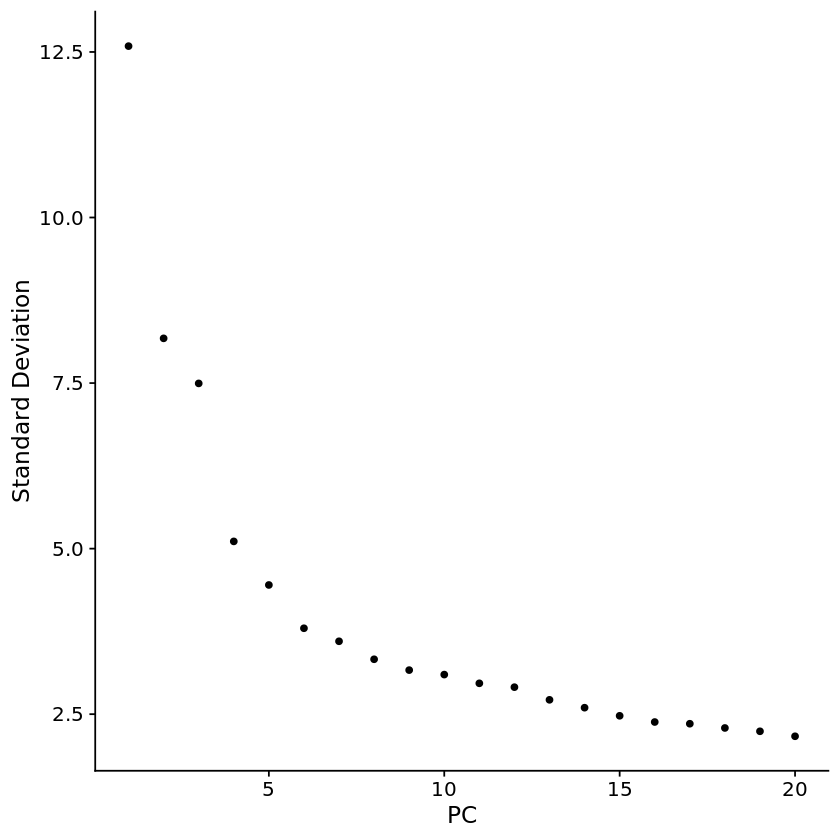

In [7]:
ElbowPlot(TENX_data_obj)

In [8]:
TENX_data_obj <- RunUMAP(TENX_data_obj, dims = 1:15, min.dist = 0.5)

Warning message:
"The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session"11:40:32 UMAP embedding parameters a = 0.583 b = 1.334
11:40:32 Read 6969 rows and found 15 numeric columns
11:40:32 Using Annoy for neighbor search, n_neighbors = 30
11:40:32 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
11:40:33 Writing NN index file to temp file /tmp/RtmpMqi802/file494740b1f0ef
11:40:33 Searching Annoy index using 1 thread, search_k = 3000
11:40:36 Annoy recall = 100%
11:40:36 Commencing smooth kNN distance calibration using 1 thread
11:40:38 Initializing from normalized Laplacian + noise
11:40:38 Commencing optimization

Warning message:
"Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session."

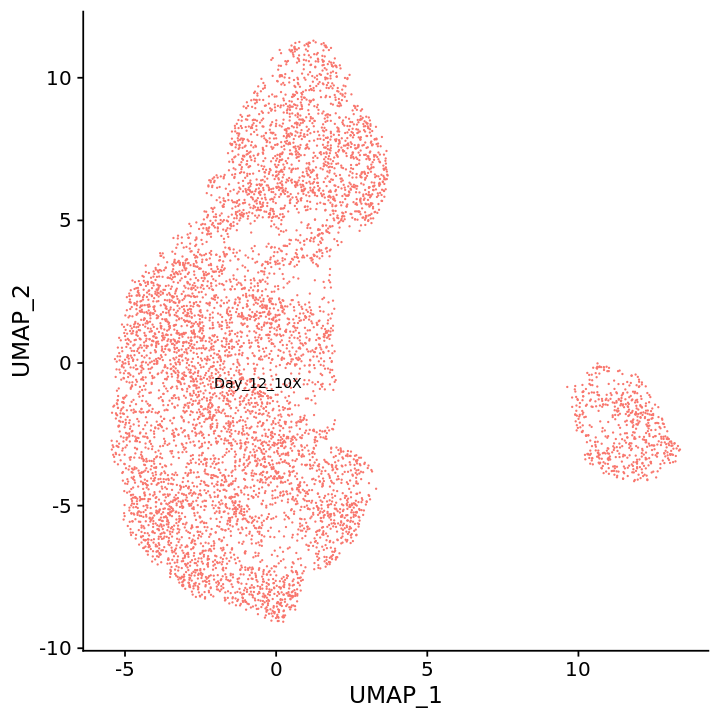

In [9]:
options(repr.plot.width = 6, repr.plot.height = 6)
DimPlot(TENX_data_obj, reduction = "umap",repel = F,label.size = 3, label = TRUE, pt.size = 0.01) + NoLegend()

## Import smartseq2 data

In [10]:
smartseq_data_obj <- readRDS("seurat/seurat_clustering.rds")
smartseq_data_obj

An object of class Seurat 
26127 features across 567 samples within 1 assay 
Active assay: RNA (26127 features)
 2 dimensional reductions calculated: pca, tsne

In [11]:
colnames(smartseq_data_obj@meta.data)[4] <- "time_point"

In [12]:
smartseq_data_obj@meta.data$project <- "smartseq"

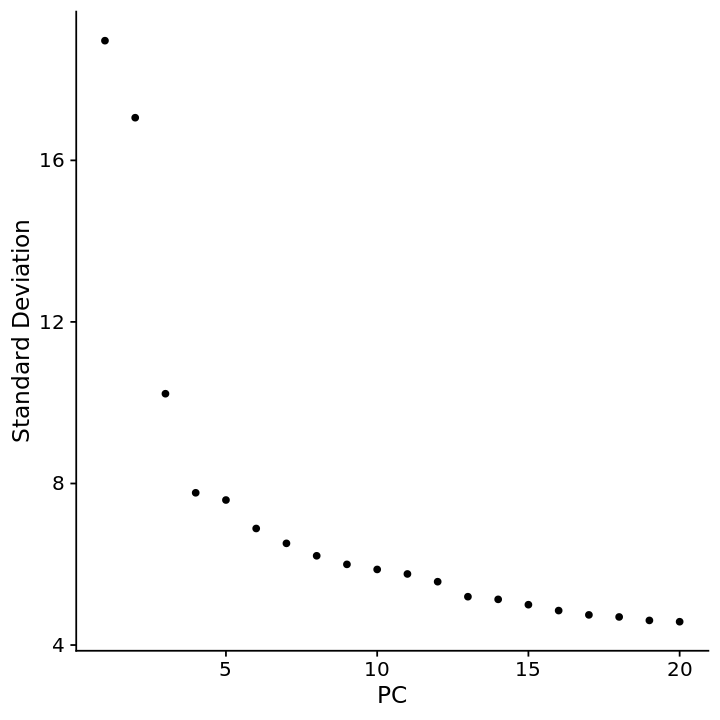

In [13]:
ElbowPlot(smartseq_data_obj)

In [14]:
smartseq_data_obj <- RunUMAP(smartseq_data_obj, dims = 1:15)

11:41:01 UMAP embedding parameters a = 0.9922 b = 1.112
11:41:01 Read 567 rows and found 15 numeric columns
11:41:01 Using Annoy for neighbor search, n_neighbors = 30
11:41:01 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
11:41:01 Writing NN index file to temp file /tmp/RtmpMqi802/file4947654806ed
11:41:01 Searching Annoy index using 1 thread, search_k = 3000
11:41:01 Annoy recall = 100%
11:41:02 Commencing smooth kNN distance calibration using 1 thread
11:41:03 Initializing from normalized Laplacian + noise
11:41:03 Commencing optimization for 500 epochs, with 19710 positive edges
11:41:05 Optimization finished


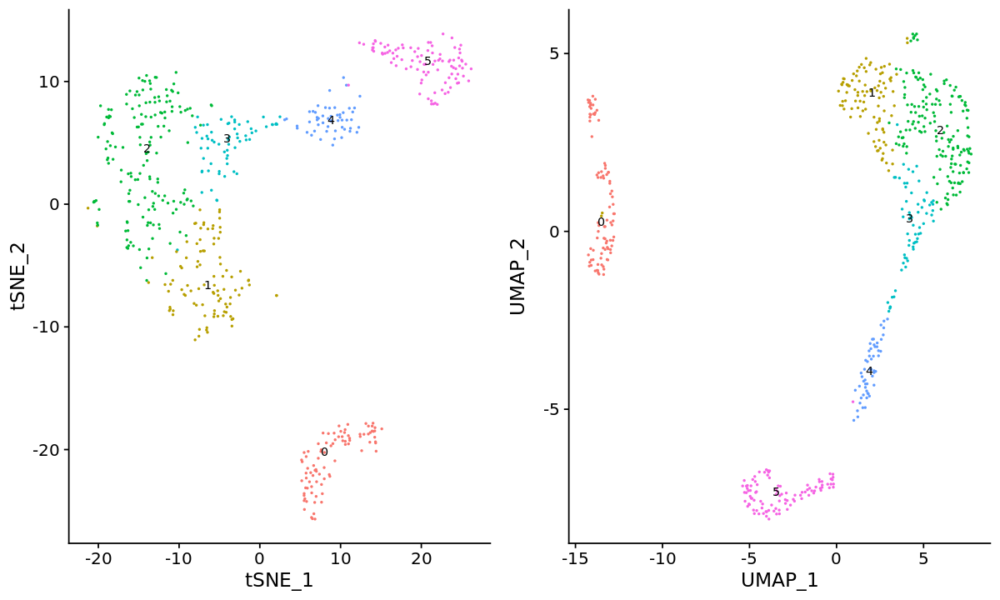

In [15]:
options(repr.plot.width = 10, repr.plot.height = 6)
p1 <- DimPlot(smartseq_data_obj, reduction = "tsne",repel = F,label.size = 3, label = TRUE, pt.size = 0.3) + NoLegend()
p2 <- DimPlot(smartseq_data_obj, reduction = "umap",repel = F,label.size = 3, label = TRUE, pt.size = 0.3) + NoLegend()

CombinePlots(
  plots = list(p1, p2))

In [16]:
## Integrate all datasets

In [17]:
reprogramming.big <- merge(Schiebinger_big.downsample, y = c(TENX_data_obj, smartseq_data_obj), add.cell.ids = c("Schiebinger", "10X", "smartseq2"), project = "GRN")
reprogramming.big

Warning message:
"Adding a Graph without an assay associated with it"Warning message:
"Adding a Graph without an assay associated with it"Warning message:
"Adding a Graph without an assay associated with it"Warning message:
"Adding a Graph without an assay associated with it"Warning message:
"Adding a Graph without an assay associated with it"Warning message:
"Adding a Graph without an assay associated with it"Warning message:
"Adding a Graph without an assay associated with it"Warning message:
"Adding a Graph without an assay associated with it"

An object of class Seurat 
28703 features across 57536 samples within 1 assay 
Active assay: RNA (28703 features)

In [18]:
# Saving merged 

saveRDS(reprogramming.big, "Schiebinger_integration/reprogramming.big.rds")
#reprogramming.big <- readRDS("Schiebinger_integration/reprogramming.big.rds")

In [33]:
reprogramming.big.list <- SplitObject(reprogramming.big, split.by = "project")

In [34]:
reprogramming.big.list

$Schiebinger
An object of class Seurat 
28703 features across 50000 samples within 1 assay 
Active assay: RNA (28703 features)

$`10X`
An object of class Seurat 
28703 features across 6969 samples within 1 assay 
Active assay: RNA (28703 features)

$smartseq
An object of class Seurat 
28703 features across 567 samples within 1 assay 
Active assay: RNA (28703 features)


In [35]:
for (i in 1:length(reprogramming.big.list)) {
    #reprogramming.big.list[[i]] <- NormalizeData(reprogramming.big.list[[i]], verbose = FALSE)
    reprogramming.big.list[[i]] <- FindVariableFeatures(reprogramming.big.list[[i]], selection.method = "vst", 
        nfeatures = 2000, verbose = FALSE)
}

In [36]:
# Changes the amount of memory that can be used by jupyter notebook - we needed an increase
options(future.globals.maxSize=2684354560000)

### My custon function to wrap integration with selected parameters.  
- Finds anchors
- Integrates selected n of features
- Computes UMAP

In [37]:
seurat_integration <- function(merged_seurat_object, 
                                dims_used = 20,  
                              k_filter = 200, 
                              k_anchors = 5, 
                              k_score = 30, 
                              integrate.all.features = TRUE,
                              n.features.to.integrate = 2000
                              ){
    # Find anchors
             anchors <- FindIntegrationAnchors(object.list = merged_seurat_object,
                                               dims = 1:dims_used, 
                                               k.filter = k_filter,
                                               k.anchor = k_anchors,
                                               k.score = k_score,
                                                  verbose = F)
    # Integrate features
        if(integrate.all.features == TRUE){
            integrated <- IntegrateData(anchorset = anchors, dims = 1:dims_used, features.to.integrate = 1:length(rownames(merged_seurat_object[[1]])))
            } else {
            integrated <- IntegrateData(anchorset = anchors, dims = 1:dims_used, features.to.integrate = 1:n.features.to.integrate)
        }
    
        DefaultAssay(integrated) <- "integrated"
        integrated <- ScaleData(integrated, verbose = FALSE)
        integrated <- RunPCA(integrated, npcs = dims_used, verbose = FALSE)
    
    # Run UMAP
        integrated <- RunUMAP(integrated, reduction = "pca", dims = 1:dims_used)
    
        
    return(integrated)
    
    
}

### My custom grid search integration function.  
- Takes as input vectors with all parameters that need to be checked
- Calculates all permutations of all parameters
- Integrates with each set of parameters (using a wrapper function above)
- Prints and saves a pdf with integrated UMAP, each set of parameters on individual page
- Does not save integrated objects. After manually browsing the pdf, repeat integration with selected parameters

In [38]:
grid_search_integration <- function(merged_seurat_object,
                              dims.used,  
                              k.filter, 
                              k.anchors, 
                              k.score,
                             pdf_name = "cross_integration.pdf") {
    # For each parameter take vector of values that will need to be tested.
    # Each parameter has to be given a vector
    
    
    print("Permuting...")
    # Generate all combination of params
    permutations <- as.matrix(crossing(dims.used, k.filter, k.anchors, k.score))
    
    print(paste("Starting integration for ", nrow(permutations)," different combinations of parameters."))
    # Integrate using different sets of params from permuts
     plot <- list()
    
    for (i in 1:nrow(permutations)) {
        
                                # Assign set of params per each iteration
                                  dims_used_perm <- permutations[i,1]  
                                  k_filter_perm <- permutations[i,2] 
                                  k_anchors_perm <- permutations[i,3] 
                                  k_score_perm <- permutations[i,4]
        
        print(paste("Integrating with ","dims_used: ",dims_used_perm,", k_filter: ",k_filter_perm,", k_anchors: ",k_anchors_perm,", k_score: ",k_score_perm,"..."))
                                # Integrate using set of params
        integrated_temp <-seurat_integration(merged_seurat_object,
                                dims_used = dims_used_perm,  
                                  k_filter = k_filter_perm, 
                                  k_anchors = k_anchors_perm, 
                                  k_score = k_score_perm)
        print("Finished")
        #Plot UMAP
       
        p1 <- DimPlot(integrated_temp, reduction = "umap",group.by = "time_point", repel = F,label.size = 3, label = TRUE, pt.size = 0.3) + NoLegend()+
                        ggtitle(paste("dims_used: ",dims_used_perm,", k_filter: ",k_filter_perm,",\nk_anchors: ",k_anchors_perm,", k_score: ",k_score_perm))
        p2 <- DimPlot(integrated_temp, reduction = "umap",group.by = "project", repel = F,label.size = 3, label = TRUE, pt.size = 0.3) + NoLegend()+
                        ggtitle(paste("dims_used: ",dims_used_perm,", k_filter: ",k_filter_perm,",\nk_anchors: ",k_anchors_perm,", k_score: ",k_score_perm))
        
        plot[[i]] <- CombinePlots(plots = list(p1, p2))
        
        }
       # Export to pdf
       pdf(pdf_name, onefile = TRUE, useDingbats = FALSE, width = 15, height = 10)
         for (i in 1:nrow(permutations)){
          plot(plot[[i]])
            }
       dev.off()
    print("Integration Grid Search FINISHED successfully.")
}

In [22]:
cross_test_object <- reprogramming.big.list[c(2,3)]

In [23]:
cross_test_object

$`10X`
An object of class Seurat 
28703 features across 6969 samples within 1 assay 
Active assay: RNA (28703 features)

$smartseq
An object of class Seurat 
28703 features across 567 samples within 1 assay 
Active assay: RNA (28703 features)


In [ ]:
grid_search_integration(reprogramming.big.list,
                             dims.used=c(20,40),  
                             k.filter=c(NA,200), 
                             k.anchors=c(5,30), 
                             k.score=c(30, 70),
                             pdf_name = "Schiebinger_10X_smartseq_integration_gridSearch.pdf")

[1] "Permuting..."
[1] "Starting integration for  16  different combinations of parameters."
[1] "Integrating with  dims_used:  20 , k_filter:  200 , k_anchors:  5 , k_score:  30 ..."


Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Warning message:
"Adding a command log without an assay associated with it"12:53:29 UMAP embedding parameters a = 0.9922 b = 1.112
12:53:29 Read 57536 rows and found 20 numeric columns
12:53:29 Using Annoy for neighbor search, n_neighbors = 30
12:53:29 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
12:53:36 Writing NN index file to temp file /tmp/RtmporxUWu/file10cc2989b582
12:53:36 Searching Annoy index using 1 thread, search_k = 3000
12:53:57 Annoy recall = 100%
12:53:58 Commencing smooth kNN distance calibration using 1 thread
12:54:01

[1] "Finished"
[1] "Integrating with  dims_used:  20 , k_filter:  200 , k_anchors:  5 , k_score:  70 ..."


Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Warning message:
"Adding a command log without an assay associated with it"13:12:53 UMAP embedding parameters a = 0.9922 b = 1.112
13:12:53 Read 57536 rows and found 20 numeric columns
13:12:53 Using Annoy for neighbor search, n_neighbors = 30
13:12:53 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
13:13:00 Writing NN index file to temp file /tmp/RtmporxUWu/file10cc88186ee
13:13:00 Searching Annoy index using 1 thread, search_k = 3000
13:13:22 Annoy recall = 100%
13:13:23 Commencing smooth kNN distance calibration using 1 thread
13:13:26 

[1] "Finished"
[1] "Integrating with  dims_used:  20 , k_filter:  200 , k_anchors:  30 , k_score:  30 ..."


Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Warning message:
"Adding a command log without an assay associated with it"13:31:42 UMAP embedding parameters a = 0.9922 b = 1.112
13:31:42 Read 57536 rows and found 20 numeric columns
13:31:42 Using Annoy for neighbor search, n_neighbors = 30
13:31:42 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
13:31:49 Writing NN index file to temp file /tmp/RtmporxUWu/file10cc75ece1f9
13:31:49 Searching Annoy index using 1 thread, search_k = 3000
13:32:11 Annoy recall = 100%
13:32:12 Commencing smooth kNN distance calibration using 1 thread
13:32:15

[1] "Finished"
[1] "Integrating with  dims_used:  20 , k_filter:  200 , k_anchors:  30 , k_score:  70 ..."


Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Warning message:
"Adding a command log without an assay associated with it"13:54:40 UMAP embedding parameters a = 0.9922 b = 1.112
13:54:40 Read 57536 rows and found 20 numeric columns
13:54:40 Using Annoy for neighbor search, n_neighbors = 30
13:54:40 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
13:54:47 Writing NN index file to temp file /tmp/RtmporxUWu/file10cc78a104df
13:54:47 Searching Annoy index using 1 thread, search_k = 3000
13:55:09 Annoy recall = 100%
13:55:10 Commencing smooth kNN distance calibration using 1 thread
13:55:13

[1] "Finished"
[1] "Integrating with  dims_used:  20 , k_filter:  NA , k_anchors:  5 , k_score:  30 ..."


Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Warning message:
"Adding a command log without an assay associated with it"14:08:25 UMAP embedding parameters a = 0.9922 b = 1.112
14:08:25 Read 57536 rows and found 20 numeric columns
14:08:25 Using Annoy for neighbor search, n_neighbors = 30
14:08:25 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
14:08:32 Writing NN index file to temp file /tmp/RtmporxUWu/file10cc3e7fa794
14:08:32 Searching Annoy index using 1 thread, search_k = 3000
14:08:54 Annoy recall = 100%
14:08:55 Commencing smooth kNN distance calibration using 1 thread
14:08:58

[1] "Finished"
[1] "Integrating with  dims_used:  20 , k_filter:  NA , k_anchors:  5 , k_score:  70 ..."


Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Warning message:
"Adding a command log without an assay associated with it"14:25:51 UMAP embedding parameters a = 0.9922 b = 1.112
14:25:51 Read 57536 rows and found 20 numeric columns
14:25:51 Using Annoy for neighbor search, n_neighbors = 30
14:25:51 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
14:25:58 Writing NN index file to temp file /tmp/RtmporxUWu/file10cc309daeb8
14:25:58 Searching Annoy index using 1 thread, search_k = 3000
14:26:19 Annoy recall = 100%
14:26:20 Commencing smooth kNN distance calibration using 1 thread
14:26:23

[1] "Finished"
[1] "Integrating with  dims_used:  20 , k_filter:  NA , k_anchors:  30 , k_score:  30 ..."


Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Warning message:
"Adding a command log without an assay associated with it"14:49:14 UMAP embedding parameters a = 0.9922 b = 1.112
14:49:14 Read 57536 rows and found 20 numeric columns
14:49:14 Using Annoy for neighbor search, n_neighbors = 30
14:49:14 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
14:49:22 Writing NN index file to temp file /tmp/RtmporxUWu/file10cc29ffd95c
14:49:22 Searching Annoy index using 1 thread, search_k = 3000
14:49:43 Annoy recall = 100%
14:49:44 Commencing smooth kNN distance calibration using 1 thread
14:49:48

[1] "Finished"
[1] "Integrating with  dims_used:  20 , k_filter:  NA , k_anchors:  30 , k_score:  70 ..."


Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Warning message:
"Adding a command log without an assay associated with it"15:16:50 UMAP embedding parameters a = 0.9922 b = 1.112
15:16:50 Read 57536 rows and found 20 numeric columns
15:16:50 Using Annoy for neighbor search, n_neighbors = 30
15:16:50 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
15:16:57 Writing NN index file to temp file /tmp/RtmporxUWu/file10cc43834d74
15:16:57 Searching Annoy index using 1 thread, search_k = 3000
15:17:19 Annoy recall = 100%
15:17:19 Commencing smooth kNN distance calibration using 1 thread
15:17:23

[1] "Finished"
[1] "Integrating with  dims_used:  40 , k_filter:  200 , k_anchors:  5 , k_score:  30 ..."


Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Warning message:
"Adding a command log without an assay associated with it"15:41:21 UMAP embedding parameters a = 0.9922 b = 1.112
15:41:22 Read 57536 rows and found 40 numeric columns
15:41:22 Using Annoy for neighbor search, n_neighbors = 30
15:41:22 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
15:41:30 Writing NN index file to temp file /tmp/RtmporxUWu/file10cc1ddb4f8d
15:41:30 Searching Annoy index using 1 thread, search_k = 3000
15:41:52 Annoy recall = 100%
15:41:53 Commencing smooth kNN distance calibration using 1 thread
15:41:56

[1] "Finished"
[1] "Integrating with  dims_used:  40 , k_filter:  200 , k_anchors:  5 , k_score:  70 ..."


Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Warning message:
"Adding a command log without an assay associated with it"16:08:27 UMAP embedding parameters a = 0.9922 b = 1.112
16:08:27 Read 57536 rows and found 40 numeric columns
16:08:27 Using Annoy for neighbor search, n_neighbors = 30
16:08:27 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
16:08:36 Writing NN index file to temp file /tmp/RtmporxUWu/file10cc14d7c223
16:08:36 Searching Annoy index using 1 thread, search_k = 3000
16:08:59 Annoy recall = 100%
16:08:59 Commencing smooth kNN distance calibration using 1 thread
16:09:02

[1] "Finished"
[1] "Integrating with  dims_used:  40 , k_filter:  200 , k_anchors:  30 , k_score:  30 ..."


Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Warning message:
"Adding a command log without an assay associated with it"16:36:22 UMAP embedding parameters a = 0.9922 b = 1.112
16:36:22 Read 57536 rows and found 40 numeric columns
16:36:22 Using Annoy for neighbor search, n_neighbors = 30
16:36:22 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
16:36:30 Writing NN index file to temp file /tmp/RtmporxUWu/file10cc5318940e
16:36:30 Searching Annoy index using 1 thread, search_k = 3000
16:36:53 Annoy recall = 100%
16:36:54 Commencing smooth kNN distance calibration using 1 thread
16:36:57

[1] "Finished"
[1] "Integrating with  dims_used:  40 , k_filter:  200 , k_anchors:  30 , k_score:  70 ..."


Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Warning message:
"Adding a command log without an assay associated with it"17:05:20 UMAP embedding parameters a = 0.9922 b = 1.112
17:05:20 Read 57536 rows and found 40 numeric columns
17:05:20 Using Annoy for neighbor search, n_neighbors = 30
17:05:20 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
17:05:30 Writing NN index file to temp file /tmp/RtmporxUWu/file10cc4931cdc3
17:05:30 Searching Annoy index using 1 thread, search_k = 3000
17:05:54 Annoy recall = 100%
17:05:54 Commencing smooth kNN distance calibration using 1 thread
17:05:58

[1] "Finished"
[1] "Integrating with  dims_used:  40 , k_filter:  NA , k_anchors:  5 , k_score:  30 ..."


Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Warning message:
"Adding a command log without an assay associated with it"17:27:09 UMAP embedding parameters a = 0.9922 b = 1.112
17:27:09 Read 57536 rows and found 40 numeric columns
17:27:09 Using Annoy for neighbor search, n_neighbors = 30
17:27:09 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
17:27:17 Writing NN index file to temp file /tmp/RtmporxUWu/file10cc649b11c5
17:27:17 Searching Annoy index using 1 thread, search_k = 3000
17:27:40 Annoy recall = 100%
17:27:41 Commencing smooth kNN distance calibration using 1 thread
17:27:44

[1] "Finished"
[1] "Integrating with  dims_used:  40 , k_filter:  NA , k_anchors:  5 , k_score:  70 ..."


Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Warning message:
"Adding a command log without an assay associated with it"17:50:33 UMAP embedding parameters a = 0.9922 b = 1.112
17:50:33 Read 57536 rows and found 40 numeric columns
17:50:33 Using Annoy for neighbor search, n_neighbors = 30
17:50:33 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
17:50:42 Writing NN index file to temp file /tmp/RtmporxUWu/file10cc2a8c9d1e
17:50:42 Searching Annoy index using 1 thread, search_k = 3000
17:51:04 Annoy recall = 100%
17:51:05 Commencing smooth kNN distance calibration using 1 thread
17:51:08

[1] "Finished"
[1] "Integrating with  dims_used:  40 , k_filter:  NA , k_anchors:  30 , k_score:  30 ..."


Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Warning message:
"Adding a command log without an assay associated with it"18:23:12 UMAP embedding parameters a = 0.9922 b = 1.112
18:23:12 Read 57536 rows and found 40 numeric columns
18:23:12 Using Annoy for neighbor search, n_neighbors = 30
18:23:12 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
18:23:20 Writing NN index file to temp file /tmp/RtmporxUWu/file10cc4352c600
18:23:20 Searching Annoy index using 1 thread, search_k = 3000
18:23:42 Annoy recall = 100%
18:23:43 Commencing smooth kNN distance calibration using 1 thread
18:23:46

[1] "Finished"
[1] "Integrating with  dims_used:  40 , k_filter:  NA , k_anchors:  30 , k_score:  70 ..."


Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Warning message:
"Adding a command log without an assay associated with it"18:56:30 UMAP embedding parameters a = 0.9922 b = 1.112
18:56:31 Read 57536 rows and found 40 numeric columns
18:56:31 Using Annoy for neighbor search, n_neighbors = 30
18:56:31 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
18:56:39 Writing NN index file to temp file /tmp/RtmporxUWu/file10cc350f60be
18:56:39 Searching Annoy index using 1 thread, search_k = 3000
18:57:01 Annoy recall = 100%
18:57:02 Commencing smooth kNN distance calibration using 1 thread
18:57:05

[1] "Finished"


### From the screening it seems that the best params are: dims_used:  40 , k_filter:  NA , k_anchors:  30 , k_score:  30

In [39]:
schieb_smart_tenx_integrated <- seurat_integration(reprogramming.big.list, 
                                        dims_used = 40,  
                                      k_filter = NA, 
                                      k_anchors = 30, 
                                      k_score = 30, 
                                      integrate.all.features = TRUE,
                                      n.features.to.integrate = 2000
                                      )

Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
12:12:06 UMAP embedding parameters a = 0.9922 b = 1.112
12:12:06 Read 57536 rows and found 40 numeric columns
12:12:06 Using Annoy for neighbor search, n_neighbors = 30
12:12:06 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
12:12:15 Writing NN index file to temp file /tmp/RtmpHKhZSQ/file8a9b42f6bcfb
12:12:15 Searching Annoy index using 1 thread, search_k = 3000
12:12:39 Annoy recall = 100%
12:12:41 Commencing smooth kNN distance calibration using 1 thread
12:12:44 Initializing from normalized Laplacian + noise
12:12:48 Commencing optimiz

In [41]:
saveRDS(schieb_smart_tenx_integrated, "Schiebinger_integration/Schiebinger_smartseq_tenx_integrated.rds")

In [16]:
#schieb_smart_tenx_integrated <- readRDS("Schiebinger_integrated/Schiebinger_smartseq_tenx_integrated.rds")

ERROR: Error in gzfile(file, "rb"): cannot open the connection


In [50]:
Idents(schieb_smart_tenx_integrated) <- "time_point"

Warning message:
"Graphs cannot be vertically aligned unless the axis parameter is set. Placing graphs unaligned."

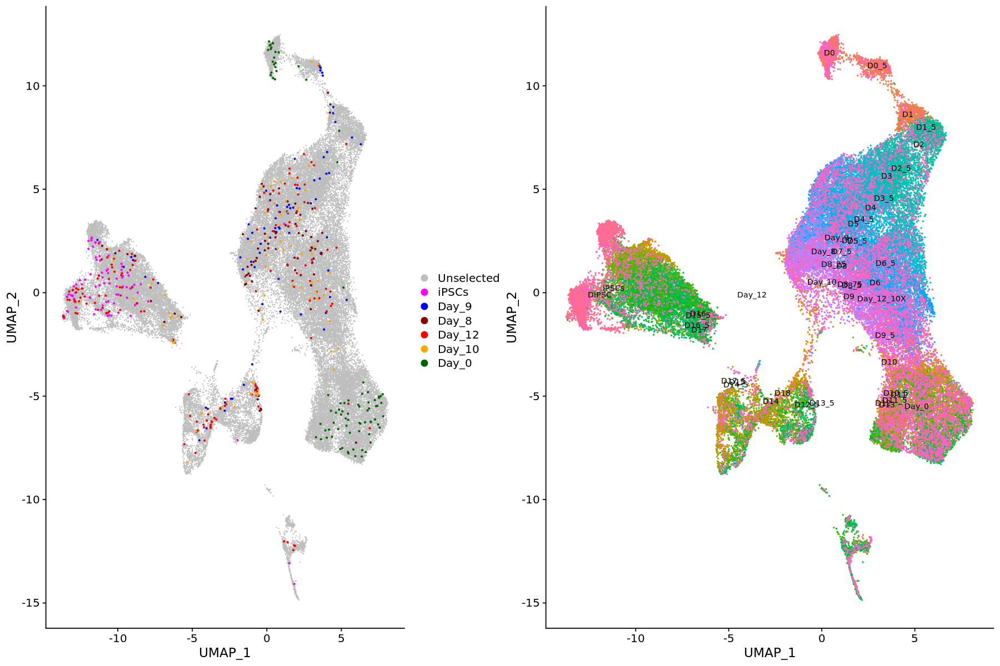

In [51]:
smartseq2 <- list(Day_0 = WhichCells(schieb_smart_tenx_integrated, idents = c("Day_0")),
                        Day_8 = WhichCells(schieb_smart_tenx_integrated, idents = c("Day_8")),
                        Day_9 = WhichCells(schieb_smart_tenx_integrated, idents = c("Day_9")),
                        Day_10 = WhichCells(schieb_smart_tenx_integrated, idents = c("Day_10")),
                        Day_12 = WhichCells(schieb_smart_tenx_integrated, idents = c("Day_12")),
                        iPSCs = WhichCells(schieb_smart_tenx_integrated, idents = c("iPSCs")))


options(repr.plot.width=15, repr.plot.height = 10)
p1 <- DimPlot(schieb_smart_tenx_integrated, label=F, 
        cells.highlight= smartseq2 , cols.highlight = c("magenta", "blue","darkred", "red", "orange","darkgreen"), cols= "grey", sizes.highlight = 0.5)

p2 <- DimPlot(schieb_smart_tenx_integrated, reduction = "umap",group.by = "time_point", repel = F,label.size = 3, label = TRUE, pt.size = 0.3) + NoLegend()

CombinePlots(plots = list(p1, p2))

Warning message:
"Graphs cannot be vertically aligned unless the axis parameter is set. Placing graphs unaligned."

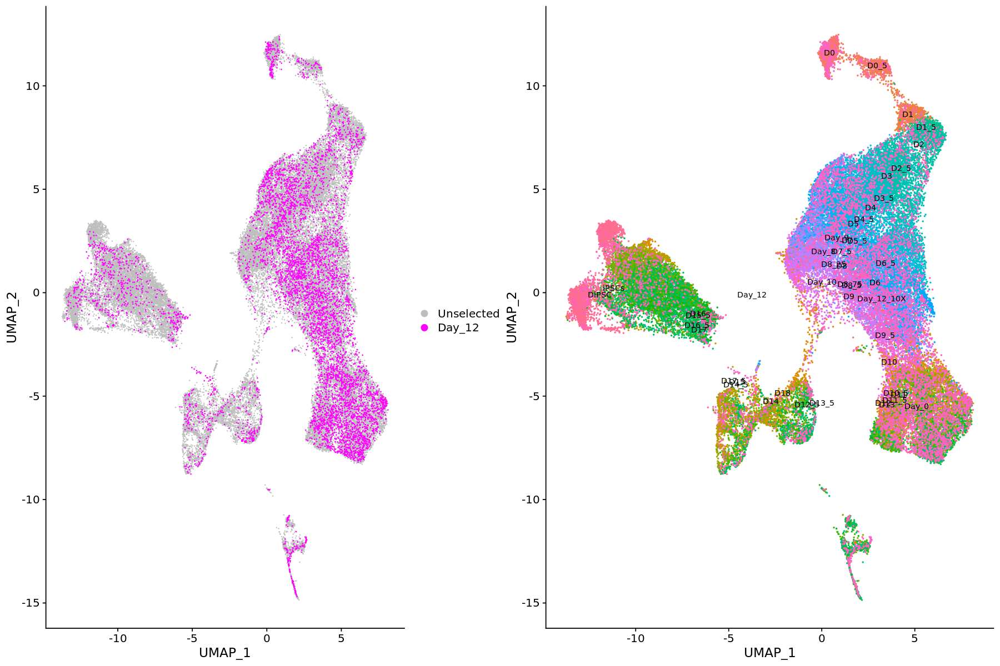

In [52]:
TENX <- list(Day_12 = WhichCells(schieb_smart_tenx_integrated, idents = c("Day_12_10X")))


options(repr.plot.width=15, repr.plot.height = 10)
p1 <- DimPlot(schieb_smart_tenx_integrated, label=F, 
        cells.highlight= TENX , cols.highlight = c("magenta"), cols= "grey", sizes.highlight = 0.1)

p2 <- DimPlot(schieb_smart_tenx_integrated, reduction = "umap",group.by = "time_point", repel = F,label.size = 3, label = TRUE, pt.size = 0.3) + NoLegend()

CombinePlots(plots = list(p1, p2))

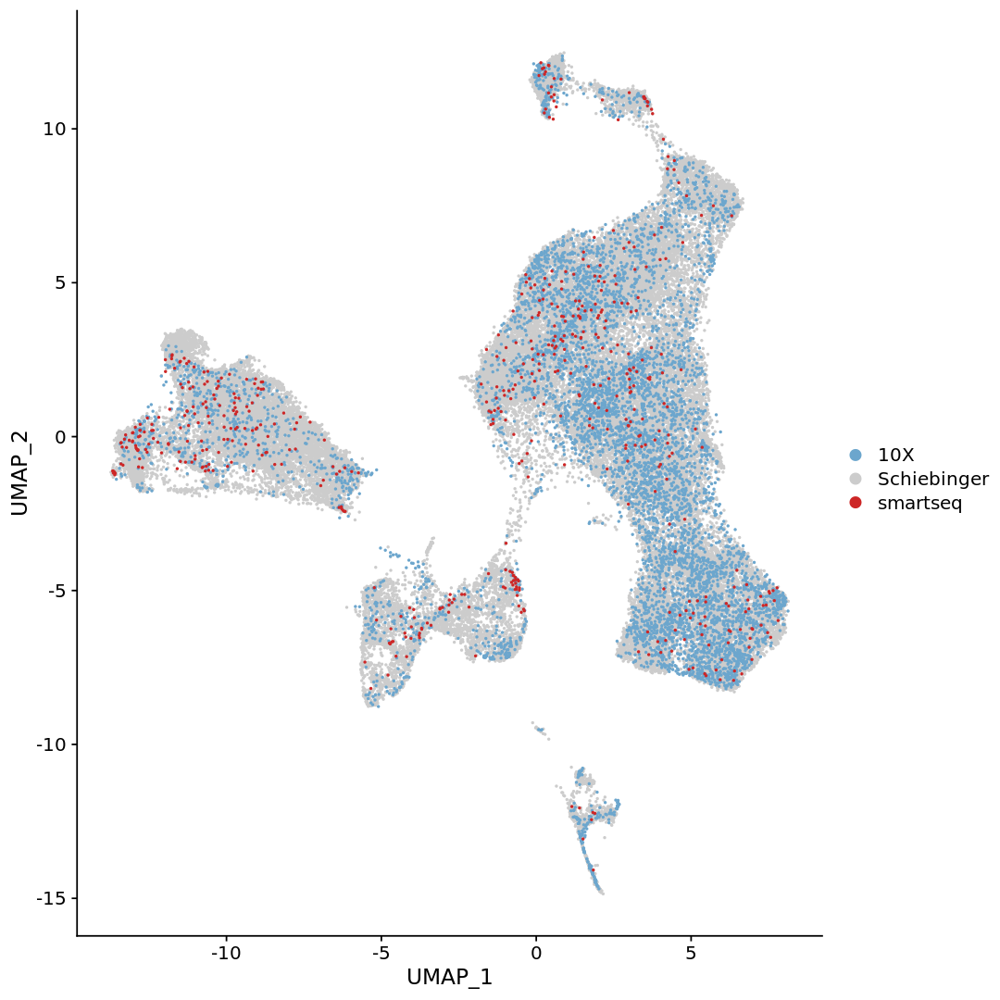

In [53]:
options(repr.plot.width=9, repr.plot.height = 9)
DimPlot(schieb_smart_tenx_integrated, reduction = "umap",group.by = "project", repel = F,label.size = 3, label = F, pt.size = 0.3) +
scale_color_manual(values = c("skyblue3","grey80","firebrick3"))#"firebrick3"

In [54]:
pdf("Schiebinger_integration/Integration_by10X.pdf", useDingbats = FALSE, width = 9, height = 9)
DimPlot(schieb_smart_tenx_integrated, reduction = "umap",group.by = "project", repel = F,label.size = 3, label = F, pt.size = 0.5) +
scale_color_manual(values = c("skyblue3","grey80","firebrick3"))
dev.off()

png 
  2

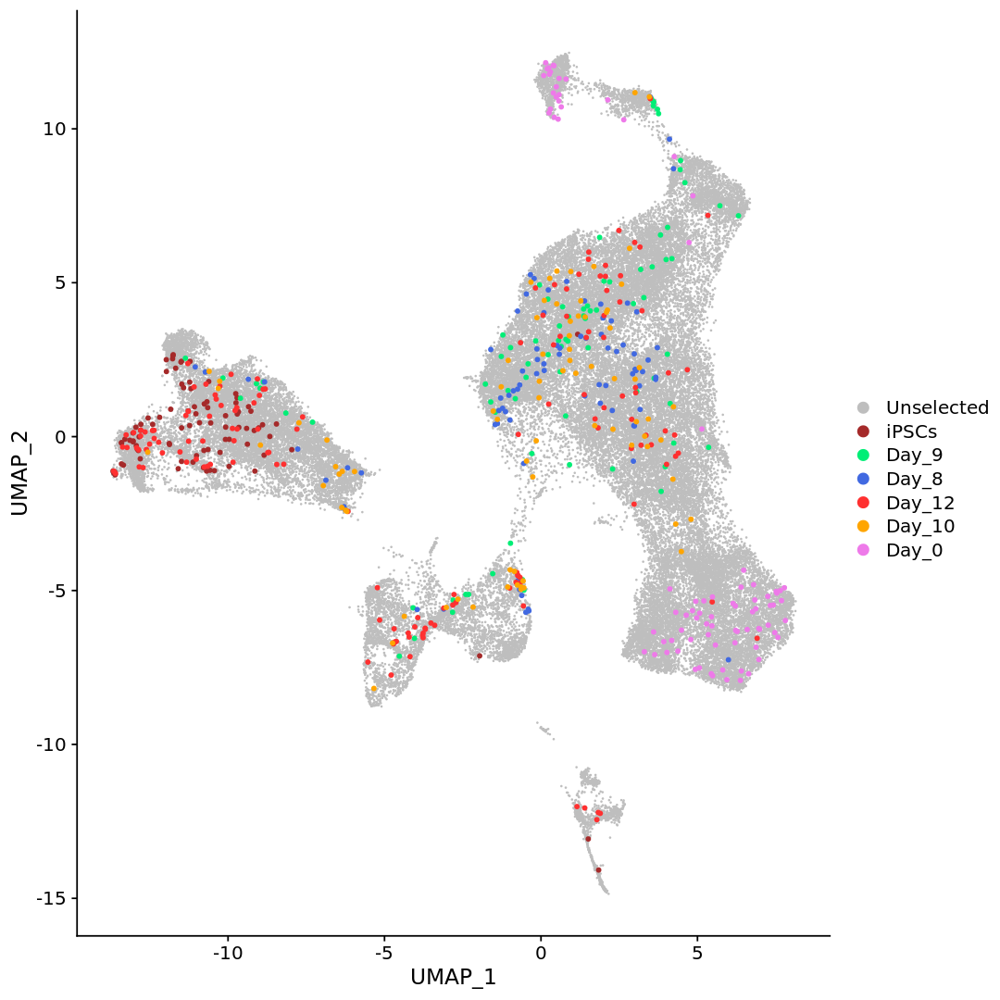

In [55]:
DimPlot(schieb_smart_tenx_integrated, label=F, 
        cells.highlight= smartseq2 , cols.highlight = c("brown","springgreen2","royalblue","firebrick1","orange","orchid2"), cols= "grey", pt.size = 0.1, sizes.highlight = 1)

In [107]:
pdf("Integration_bysmartseq2.pdf", useDingbats = FALSE, width = 8, height = 9)
DimPlot(schieb_smart_tenx_integrated, label=F, 
        cells.highlight= smartseq2 , cols.highlight = c("brown","springgreen2","royalblue","firebrick1","orange","orchid2"), cols= "grey", pt.size = 0.1, sizes.highlight = 1)
dev.off()

png 
  2

In [56]:
# Define the number of colors you want
library(RColorBrewer)
nb.cols <- 47
mycolors <- colorRampPalette(brewer.pal(8, "Set2"))(nb.cols)

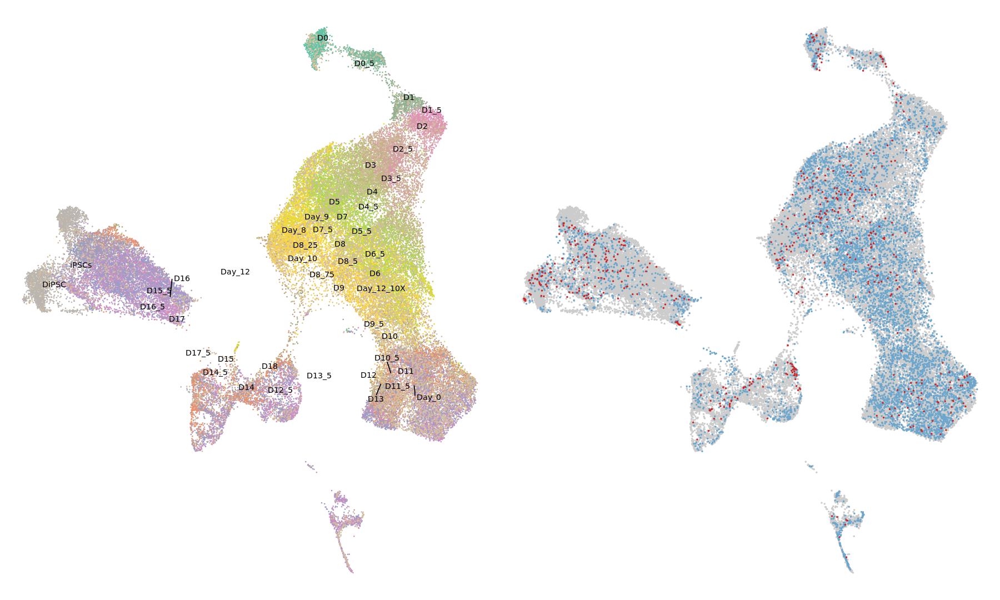

In [57]:
options(repr.plot.width=15, repr.plot.height = 9)
p1 <- DimPlot(schieb_smart_tenx_integrated, reduction = "umap",group.by = "time_point", repel = T,label.size = 3, label = T, pt.size = 0.1)  + scale_color_manual(values=mycolors) + theme_void() + NoLegend()
p2 <- DimPlot(schieb_smart_tenx_integrated, reduction = "umap",group.by = "project", repel = F,label.size = 3, label = F, pt.size = 0.3) + 
                scale_color_manual(values = c("skyblue3","grey80","firebrick3")) + theme_void() +NoLegend()

CombinePlots(plots = list(p1,p2))

In [178]:
# Exporting

## BY Timepoint
pdf("Integration_byTimepoint_NoLegend.pdf", useDingbats = FALSE, width = 7.5, height = 9)
 DimPlot(schieb_smart_tenx_integrated, reduction = "umap",group.by = "time_point", repel = T,label.size = 3, label = T, pt.size = 0.1)  + scale_color_manual(values=mycolors) + theme_void() + NoLegend()
dev.off()

pdf("Integration_byTimepoint.pdf", useDingbats = FALSE, width = 9, height = 9)
 DimPlot(schieb_smart_tenx_integrated, reduction = "umap",group.by = "time_point", repel = T,label.size = 3, label = T, pt.size = 0.1)  + scale_color_manual(values=mycolors) + theme_void()
dev.off()

## BY Dataset
pdf("Integration_byDataset_NoLegend.pdf", useDingbats = FALSE, width = 7.5, height = 9)
DimPlot(schieb_smart_tenx_integrated, reduction = "umap",group.by = "project", repel = F,label.size = 3, label = F, pt.size = 0.3) + 
                scale_color_manual(values = c("skyblue3","grey80","firebrick3")) + theme_void() +NoLegend()
dev.off()

pdf("Integration_byDataset.pdf", useDingbats = FALSE, width = 9, height = 9)
DimPlot(schieb_smart_tenx_integrated, reduction = "umap",group.by = "project", repel = F,label.size = 3, label = F, pt.size = 0.3) + 
                scale_color_manual(values = c("skyblue3","grey80","firebrick3")) + theme_void()
dev.off()

png 
  2

png 
  2

png 
  2

png 
  2

In [119]:
pdf("Integration_byTimepoint.pdf", useDingbats = FALSE, width = 7.5, height = 9)
DimPlot(schieb_smart_tenx_integrated, reduction = "umap",group.by = "time_point", repel = T,label.size = 3, label = TRUE, pt.size = 0.1) + NoLegend()
dev.off()

png 
  2

In [132]:
### Make paper quality figures in ggplot

UMAP_dims <- as.data.frame(schieb_smart_tenx_integrated@reductions$umap@cell.embeddings)
UMAP_dims$cell <- rownames(UMAP_dims)
meta_data_umap <- as.data.frame(schieb_smart_tenx_integrated@meta.data)
meta_data_umap$cell <- rownames(meta_data_umap)
meta_data_umap <- dplyr::left_join(meta_data_umap, UMAP_dims, by = "cell")

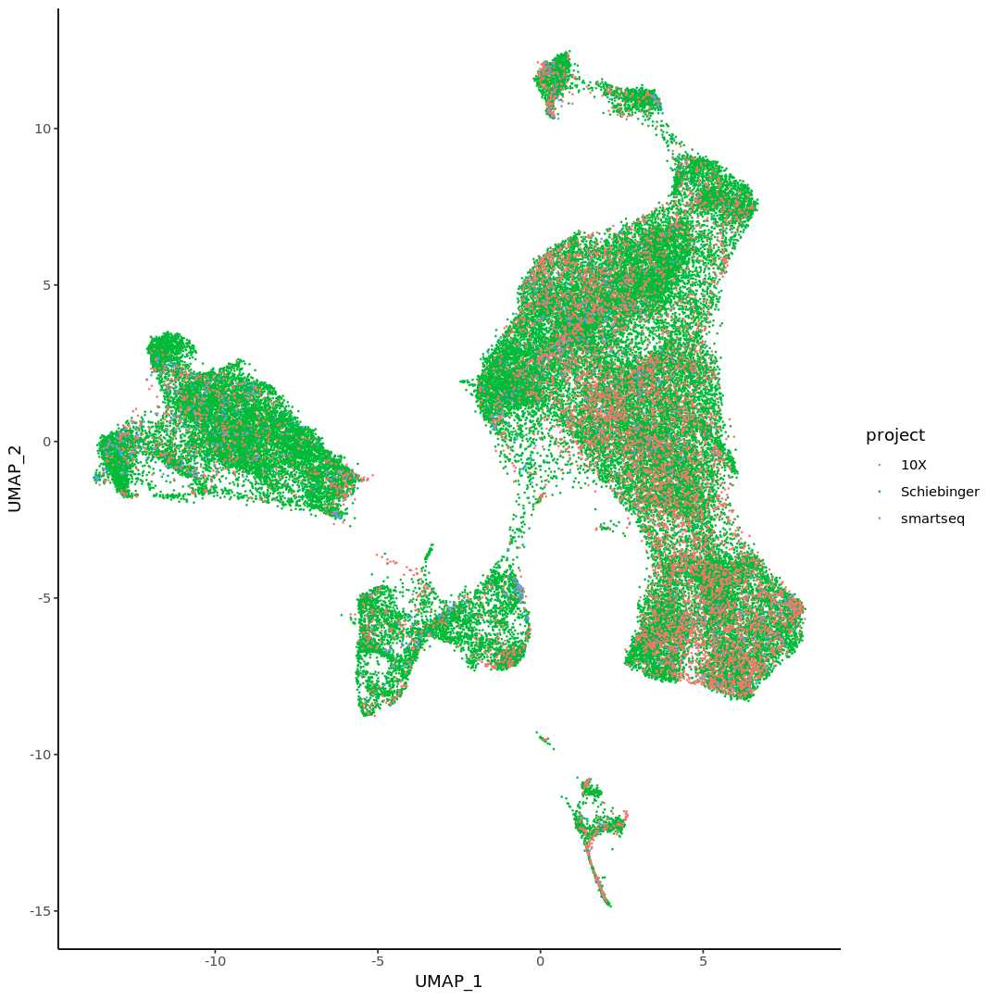

In [148]:
options(repr.plot.width=9, repr.plot.height = 9)
ggplot(meta_data_umap, aes(UMAP_1, UMAP_2, color = project)) +
    geom_point(size = 0.1, alpha = 1) +
theme_classic() 

### Investigate the expression before integration (rna) and after integration

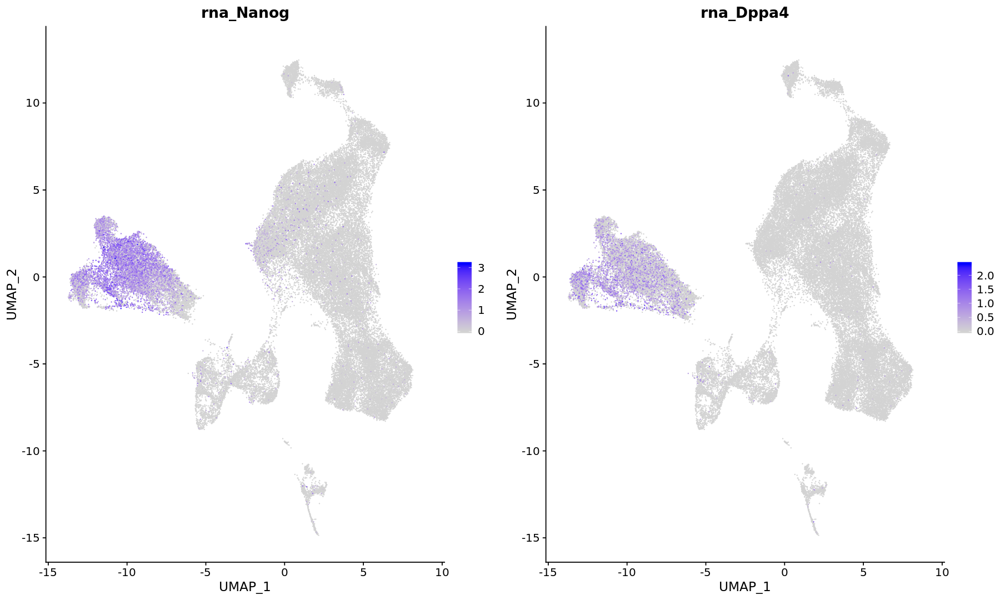

In [58]:
FeaturePlot(schieb_smart_tenx_integrated, features = c("rna_Nanog", "rna_Dppa4"))

In [59]:
gene_expr_plot <- function(object, gene, reduction = "umap") {

FeaturePlot(object, features = c(gene), reduction = reduction, pt.size = .1)+ scale_color_viridis(option = "D") + labs(#title = "Single-cell gene regulatory atlas\nof integrated mouse iPSC reprogramming",
              title = paste(gene, " expression")) +
theme(
  plot.title = element_text(hjust = 0),
  plot.subtitle = element_text(hjust = 0))+
theme(axis.line=element_blank(),axis.text.x=element_blank(),
          axis.text.y=element_blank(),axis.ticks=element_blank(),
          axis.title.x=element_blank(),
          axis.title.y=element_blank(),#legend.position="none",
          panel.background=element_blank(),panel.border=element_blank(),panel.grid.major=element_blank(),
          panel.grid.minor=element_blank(),plot.background=element_blank())
    }

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.


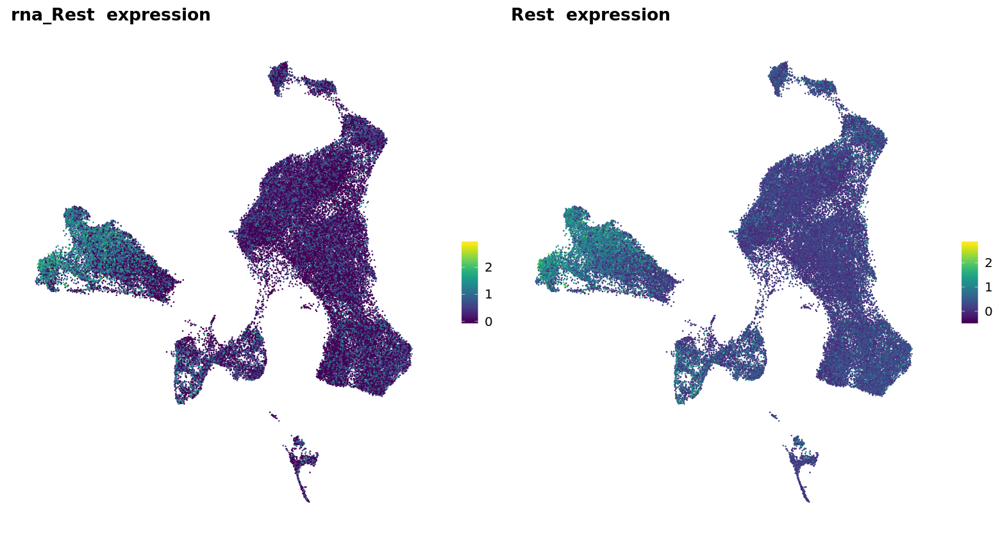

In [60]:
options(repr.plot.width=13, repr.plot.height = 7)
p1 <- gene_expr_plot(schieb_smart_tenx_integrated, "rna_Rest")
p2 <- gene_expr_plot(schieb_smart_tenx_integrated, "Rest")
CombinePlots(plots = list(p1, p2))

# AUCell for Signatures from Schiebinger et al., 2019

In [61]:
# Load normalized expression matrix
exprMatrix <- schieb_smart_tenx_integrated@assays$RNA@data

In [2]:
library(AUCell)
library(GSEABase)
library(mixtools)
library(readr)

Registered S3 method overwritten by 'R.oo':
  method        from       
  throw.default R.methodsS3

Attaching package: 'AUCell'

The following object is masked from 'package:base':

    cbind

Loading required package: BiocGenerics
Loading required package: parallel

Attaching package: 'BiocGenerics'

The following objects are masked from 'package:parallel':

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB

The following object is masked from 'package:AUCell':

    cbind

The following objects are masked from 'package:stats':

    IQR, mad, sd, var, xtabs

The following objects are masked from 'package:base':

    Filter, Find, Map, Position, Reduce, anyDuplicated, append,
    as.data.frame, basename, cbind, colnames, dirname, do.call,
    duplicated, eval, evalq, get, grep, grepl, intersect, is.unsorted,
    lapply, mapply, match, mget, order, paste, pmax, pm

In [63]:
# Load gene sets

# Import Schiebinger signatures published as a supplementary xlsx file with Schiebinger et al publication
schiebinger_sig <- read_delim("Schiebinger_integration/raw_data/Schiebinger_signatures.csv", delim = ';')

# Some gsub cleaning to remove spaces, brackets, digits at the start of the name etc
schiebinger_sig <- schiebinger_sig[,1:27]
schiebinger_sig_l <- gather(schiebinger_sig, signature, gene)
schiebinger_sig_l_noNA <- schiebinger_sig_l[complete.cases(schiebinger_sig_l),]
schiebinger_sig_l_noNA$signature <- gsub(" ","\\.", schiebinger_sig_l_noNA$signature)
schiebinger_sig_l_noNA$signature <- gsub("\\(","", schiebinger_sig_l_noNA$signature)
schiebinger_sig_l_noNA$signature <- gsub("\\)","", schiebinger_sig_l_noNA$signature)
schiebinger_sig_l_noNA$signature <- gsub("2c","twoCell", schiebinger_sig_l_noNA$signature)

Warning message:
"Missing column names filled in: 'X28' [28], 'X29' [29], 'X30' [30], 'X31' [31]"Parsed with column specification:
cols(
  .default = col_character(),
  X28 = col_logical(),
  X29 = col_logical(),
  X30 = col_logical(),
  X31 = col_logical()
)
See spec(...) for full column specifications.


In [64]:
head(schiebinger_sig_l_noNA)

signature,gene
MEF.identity,Gm5571
MEF.identity,Rbfox2
MEF.identity,Btbd19
MEF.identity,Actn1
MEF.identity,Gatad2a
MEF.identity,Med6


In [68]:
# Function from AUCell which creates a named vector with all signatures

sets <- vector()

CompileGeneSets <- function(data) {

for (i in seq(unique(data$signature))) {
    
    sets <- c(sets, GeneSet(
                            unique(filter(data, 
                                   signature == unique(data$signature)[i])$gene), 
                            
                            setName=unique(data$signature)[i]))
}
    
geneSets <- GeneSetCollection(sets)

print(names(geneSets))

return(geneSets)
    
}

In [73]:
geneSets <- CompileGeneSets(schiebinger_sig_l_noNA)

 [1] "MEF.identity"                         
 [2] "Pluripotency"                         
 [3] "Proliferation"                        
 [4] "ER.stress"                            
 [5] "Epithelial.identity"                  
 [6] "ECM.rearrangement"                    
 [7] "Apoptosis"                            
 [8] "Senescence"                           
 [9] "Neural.identity"                      
[10] "Trophoblast.identity"                 
[11] "X.reactivation"                       
[12] "XEN"                                  
[13] "Trophoblast.progenitors"              
[14] "Spiral.Artery.Trophpblast.Giant.Cells"
[15] "Spongiotrophoblasts"                  
[16] "Oligodendrocyte.precursor.cells.OPC"  
[17] "Astrocytes"                           
[18] "Cortical.Neurons"                     
[19] "RadialGlia-Id3"                       
[20] "RadialGlia-Gdf10"                     
[21] "RadialGlia-Neurog2"                   
[22] "Long-term.MEFs"                       
[23] "Embr

Quantiles for the number of genes detected by cell: 
(Non-detected genes are shuffled at the end of the ranking. Keep it in mind when choosing the threshold for calculating the AUC).


 min   1%   5%  10%  50% 100% 
 114  933 1203 1439 2659 9744 


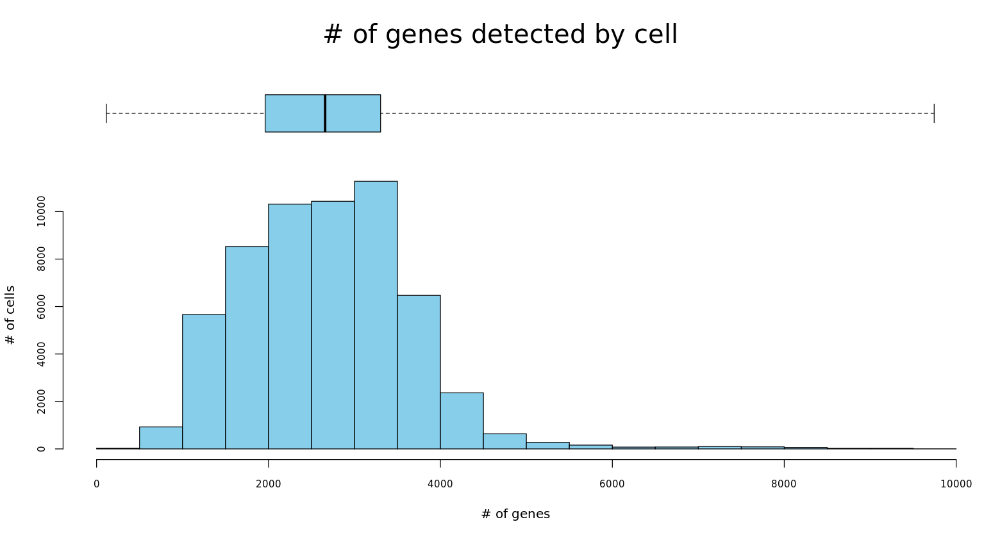

In [79]:
# Build gene-expression rankings for each cell
# Increasing nCores might give an error if the node is already overloaded

cells_rankings <- AUCell_buildRankings(exprMatrix, nCores=1, plotStats=TRUE)

# For active analyses it's worth to save rankings, because buildRankings() takes a while:

#save(cells_rankings, file="cells_rankings.RData")

In [80]:
# Calculate enrichment for the gene signatures (AUC)

cells_AUC <- AUCell_calcAUC(geneSets, cells_rankings)
save(cells_AUC, file="Schiebinger_integration/cells_AUC_Schiebinger_int.RData")

Genes in the gene sets NOT available in the dataset: 
	MEF.identity: 	41 (14% of 300)
	Proliferation: 	1 (1% of 97)
	ER.stress: 	2 (1% of 172)
	ECM.rearrangement: 	7 (4% of 182)
	Apoptosis: 	1 (1% of 193)
	Senescence: 	8 (14% of 58)
	X.reactivation: 	343 (32% of 1085)
	Spongiotrophoblasts: 	1 (0% of 500)
	Oligodendrocyte.precursor.cells.OPC: 	41 (8% of 500)
	Astrocytes: 	42 (8% of 500)
	Cortical.Neurons: 	5 (3% of 183)
	RadialGlia-Id3: 	15 (3% of 500)
	RadialGlia-Gdf10: 	15 (3% of 500)
	RadialGlia-Neurog2: 	15 (3% of 500)
	Long-term.MEFs: 	1 (0% of 500)
	Embryonic.mesenchyme: 	2 (1% of 224)
	twoCell: 	68 (23% of 301)


In [10]:
load("Schiebinger_integration/cells_AUC_Schiebinger_int.RData")

In [12]:
options(repr.plot.width = 15, repr.plot.height=40)
set.seed(123)

par(mfrow=c(9,3)) 
cells_assignment <- AUCell_exploreThresholds(cells_AUC, plotHist=FALSE, assign=TRUE) 

In [13]:
AUC_values <- cells_AUC@assays@data@listData$AUC

In [42]:
#schieb_smart_tenx_integrated <- readRDS("/staging/leuven/stg_00041/Adrian/TALON_JANISZEWSKI_XC2/Schiebinger_integrated/Schiebinger_smartseq_tenx_integrated.rds")
colnames(schieb_smart_tenx_integrated@meta.data)

[1] "orig.ident"             "nCount_RNA"             "nFeature_RNA"          
 [4] "cell_ID"                "time_point"             "cell_number"           
 [7] "Experiment"             "condition"              "Dox_status"            
[10] "project"                "RNA_snn_res.0.5"        "seurat_clusters"       
[13] "percent.mt"             "RNA_snn_res.0.2"        "RNA_snn_res.0.15"      
[16] "Xi"                     "Cell"                   "GC_index1_index2"      
[19] "Name"                   "seurat_clusters_rename"

### Adding gene signature information to seurat object meta data for easy exploration

In [43]:
schieb_smart_tenx_integrated@meta.data <- cbind(schieb_smart_tenx_integrated@meta.data, t(AUC_values))

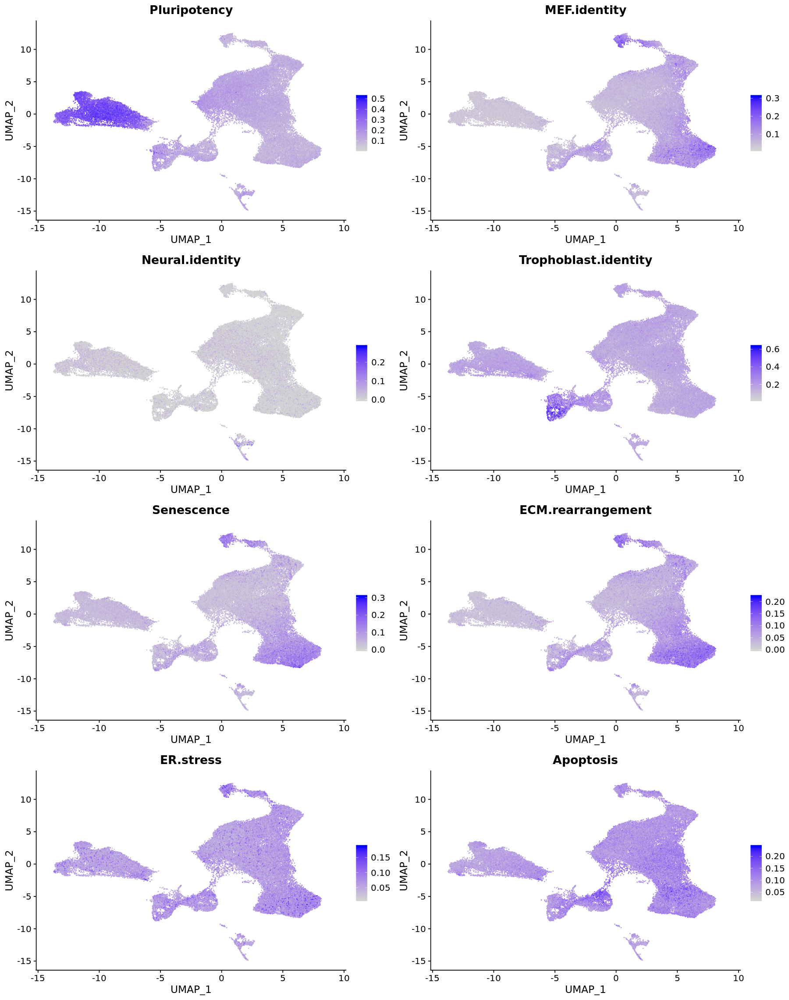

In [44]:
options(repr.plot.width = 15, repr.plot.height=19)
FeaturePlot(schieb_smart_tenx_integrated, ncol =2, features = c("Pluripotency", "MEF.identity",
                                                                "Neural.identity","Trophoblast.identity",
                                                               "Senescence","ECM.rearrangement",
                                                               "ER.stress","Apoptosis"), pt.size = 0.1) +scale_color_viridis()

### Custom wrapper function to nicely plot signatures 

In [45]:
gene_sig_plot <- function(object, gene, reduction = "umap") {

FeaturePlot(object, features = c(gene), reduction = reduction, pt.size = .1)+ scale_color_viridis(option = "C") + labs(#title = "Single-cell gene regulatory atlas\nof integrated mouse iPSC reprogramming",
              title = paste(gene, " signature score")) +
theme(
  plot.title = element_text(hjust = 0),
  plot.subtitle = element_text(hjust = 0))+
theme(axis.line=element_blank(),axis.text.x=element_blank(),
          axis.text.y=element_blank(),axis.ticks=element_blank(),
          axis.title.x=element_blank(),
          axis.title.y=element_blank(),#legend.position="none",
          panel.background=element_blank(),panel.border=element_blank(),panel.grid.major=element_blank(),
          panel.grid.minor=element_blank(),plot.background=element_blank())
    }

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.


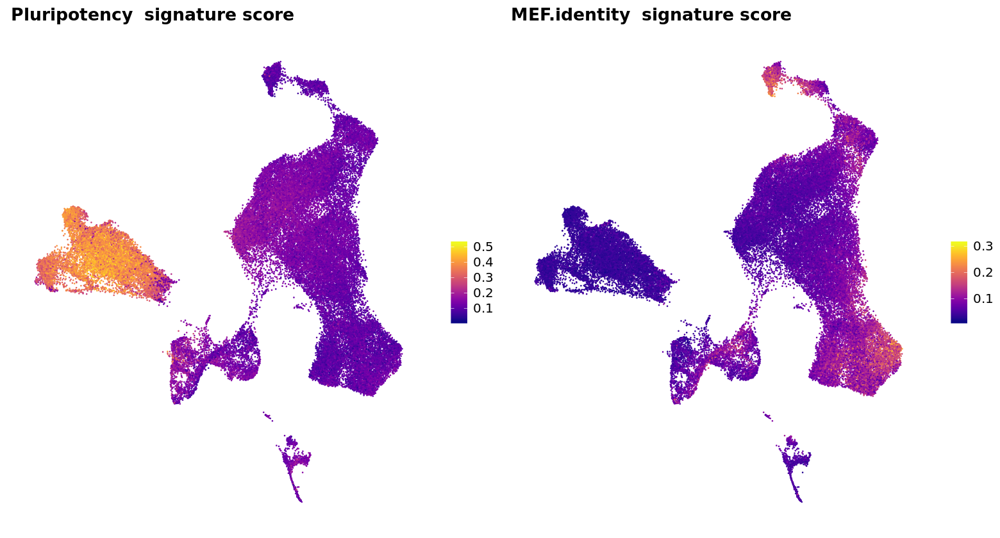

In [46]:
options(repr.plot.width=13, repr.plot.height = 7)
p1 <- gene_sig_plot(schieb_smart_tenx_integrated, "Pluripotency")
p2 <- gene_sig_plot(schieb_smart_tenx_integrated, "MEF.identity")
CombinePlots(plots = list(p1, p2))

In [212]:
plots <- list()

for (i in seq(names(geneSets))) {
    plots[[i]] <- gene_sig_plot(schieb_smart_tenx_integrated, names(geneSets)[i]) 
    }

pdf("Schiebinger_integration/Signatures_UMAP_schieb_smart_tenx_integrated.pdf", useDingbats = FALSE, width = 6, height = 6)
plots
dev.off()

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]

[[10]]

[[11]]

[[12]]

[[13]]

[[14]]

[[15]]

[[16]]

[[17]]

[[18]]

[[19]]

[[20]]

[[21]]

[[22]]

[[23]]

[[24]]

[[25]]

[[26]]

[[27]]


png 
  2

In [47]:
meta_sig <- as.data.frame(schieb_smart_tenx_integrated@meta.data)

### Custom wrapper function to nicely plot signatures and their distribution and the threshold

In [49]:
options(repr.plot.width=6, repr.plot.height = 4)

plot_sig_thr <- function(data, signature, threshold){ 
    
    # data is meta.data with columns containing auc score of AUCell signatures
    # signature is the name of the signature to plot the distribution of
    # cell assignment object from AUCell pipeline to indicate a default theshold
    
    text_pos_x <- round(threshold,2)
    
    text_pos_y <- 1 
    
    ggplot(data, aes_string(signature)) + geom_density(color = "darkblue", fill = "darkblue", alpha = 0.1) +
        geom_vline(xintercept = threshold, size = 1, color = "salmon") + 
        annotate("text", x = text_pos_x+.02,  y = 5, label = paste(round(threshold,2)))+
        theme_classic()
    
    }

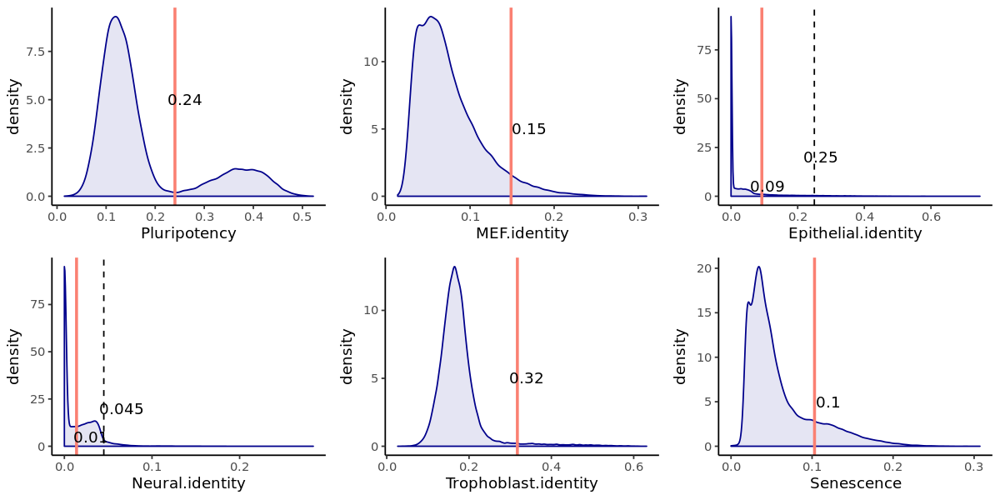

In [50]:
options(repr.plot.width=10, repr.plot.height = 5)

p1 <- plot_sig_thr(meta_sig, "Pluripotency", cells_assignment[['Pluripotency']]$aucThr$selected)
p2 <- plot_sig_thr(meta_sig, "MEF.identity", cells_assignment[['MEF.identity']]$aucThr$selected)
p3 <- plot_sig_thr(meta_sig, "Epithelial.identity", cells_assignment[['Epithelial.identity']]$aucThr$selected)+ geom_vline(xintercept = 0.25, linetype = "dashed") + 
                                annotate("text", x = 0.25+.02,  y = 20, label = paste(0.25))
p4 <- plot_sig_thr(meta_sig, "Neural.identity", cells_assignment[['Neural.identity']]$aucThr$selected) + geom_vline(xintercept = 0.045, linetype = "dashed") + 
                                annotate("text", x = 0.045+.02,  y = 20, label = paste(0.045))
p5 <- plot_sig_thr(meta_sig, "Trophoblast.identity", cells_assignment[['Trophoblast.identity']]$aucThr$selected)
p6 <- plot_sig_thr(meta_sig, "Senescence", cells_assignment[['Senescence']]$aucThr$selected)

plots <- list(p1,p2,p3,p4,p5,p6)

CombinePlots(plots = plots)

In [51]:
pdf('Schiebinger_integration/schieb_smart_tenx_integrated_AUC_thresholds.pdf', useDingbats = FALSE, width=10, height = 5)
CombinePlots(plots = plots)
dev.off()

png 
  2

### Assign identity to the cell based on the score threshold

In [52]:
schieb_smart_tenx_integrated@meta.data <- schieb_smart_tenx_integrated@meta.data %>%
                                                    tibble::rownames_to_column('rownames') %>%   
                                                        mutate(identity = case_when(
                                                                        Pluripotency > 0.24 ~ "Pluripotent",
                                                                        MEF.identity > 0.15 ~  "MEF",
                                                                        Epithelial.identity > 0.25 ~ "Epithelial",
                                                                        Neural.identity > 0.045 ~ "Neural",
                                                                        Trophoblast.identity > 0.32 ~ "Trophoblast",
                                                                        Senescence > 0.1 ~ "Senescent",
                                                                        TRUE ~ "other")) %>%
                                                    tibble::column_to_rownames('rownames')

In [53]:
table(schieb_smart_tenx_integrated@meta.data$identity)


 Epithelial         MEF      Neural Pluripotent   Senescent Trophoblast 
       2252        2886        2266       11720        6227         909 
      other 
      31276 

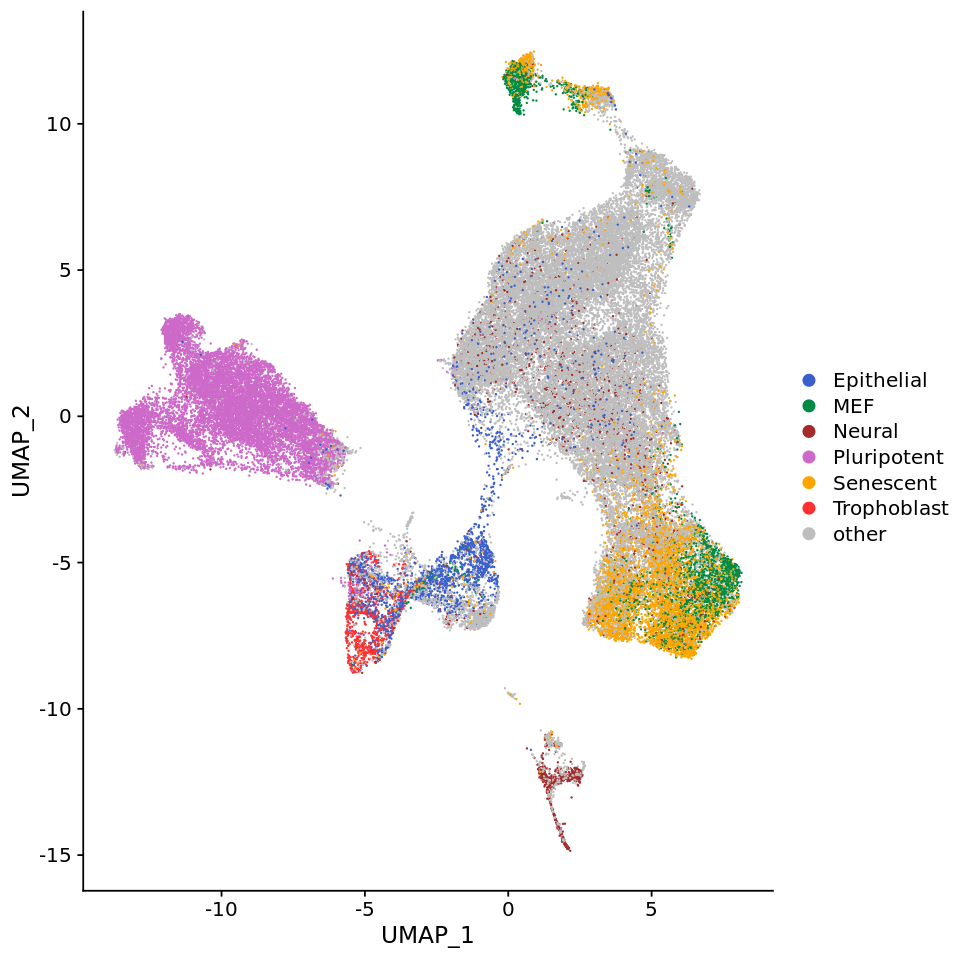

In [54]:
options(repr.plot.width=8, repr.plot.height = 8)
DimPlot(schieb_smart_tenx_integrated, group.by = "identity") + scale_color_manual(values=c("royalblue3","springgreen4","brown","orchid3","orange","firebrick1","grey"))

In [55]:
pdf("Schiebinger_integration/schieb_smart_tenx_integrated_AUC_Identities_noLegend.pdf", useDingbats = F, width = 7.5, height = 9)
DimPlot(schieb_smart_tenx_integrated, group.by = "identity") + scale_color_manual(values=c("royalblue3","springgreen4","brown","orchid3","orange","firebrick1","grey")) + NoLegend()
dev.off()

png 
  2

In [56]:
# Export meta data
write.csv(schieb_smart_tenx_integrated@meta.data, "Schiebinger_integration/schieb_smart_tenx_integrated_meta_data.csv")

In [57]:
Idents(schieb_smart_tenx_integrated) <- "identity"

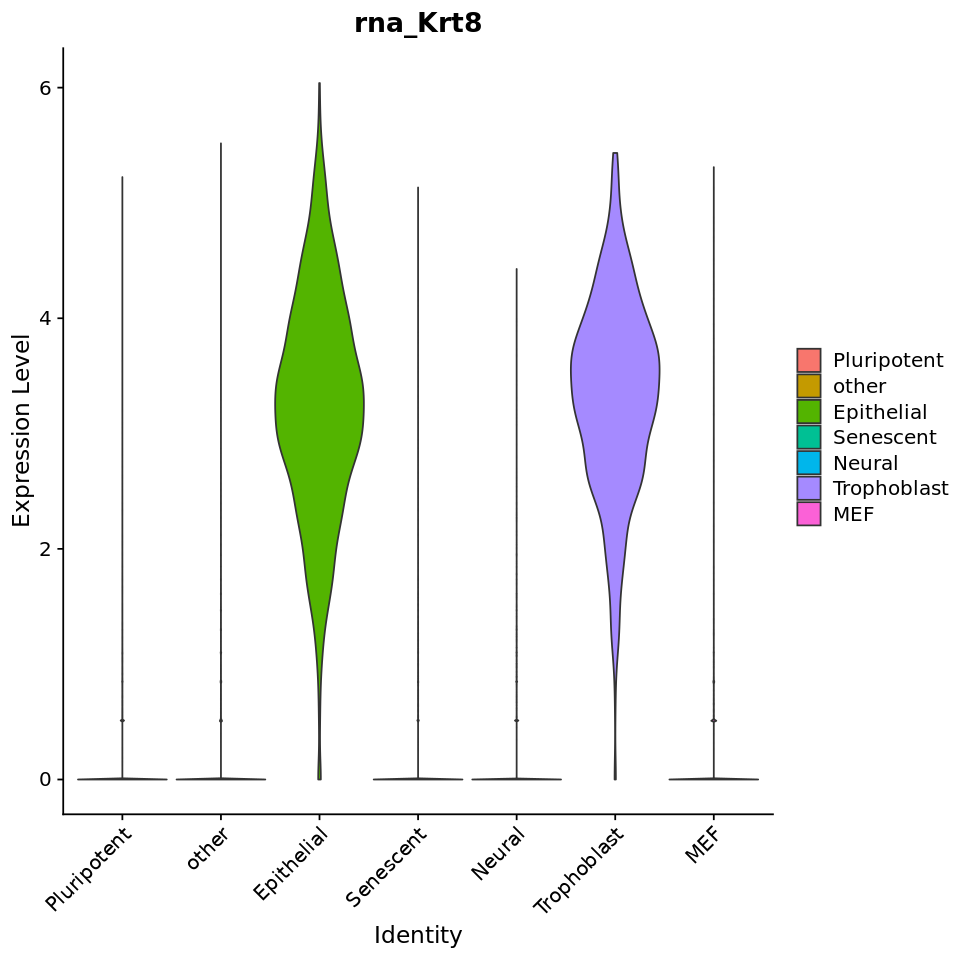

In [58]:
VlnPlot(schieb_smart_tenx_integrated, pt.size = 0,features = c("rna_Krt8"))

# Calculate how many of our smart-seq cells falls into each category/identity

In [59]:
schieb_smart_tenx_integrated@meta.data %>%
                            filter(project == "smartseq") %>%
                            group_by(project, time_point,identity) %>%
                           tally() 
                           

project,time_point,identity,n
smartseq,Day_0,MEF,82
smartseq,Day_0,Senescent,1
smartseq,Day_0,other,3
smartseq,Day_10,Epithelial,71
smartseq,Day_10,Pluripotent,4
smartseq,Day_10,Senescent,1
smartseq,Day_10,other,4
smartseq,Day_12,Epithelial,70
smartseq,Day_12,MEF,1
smartseq,Day_12,Neural,1


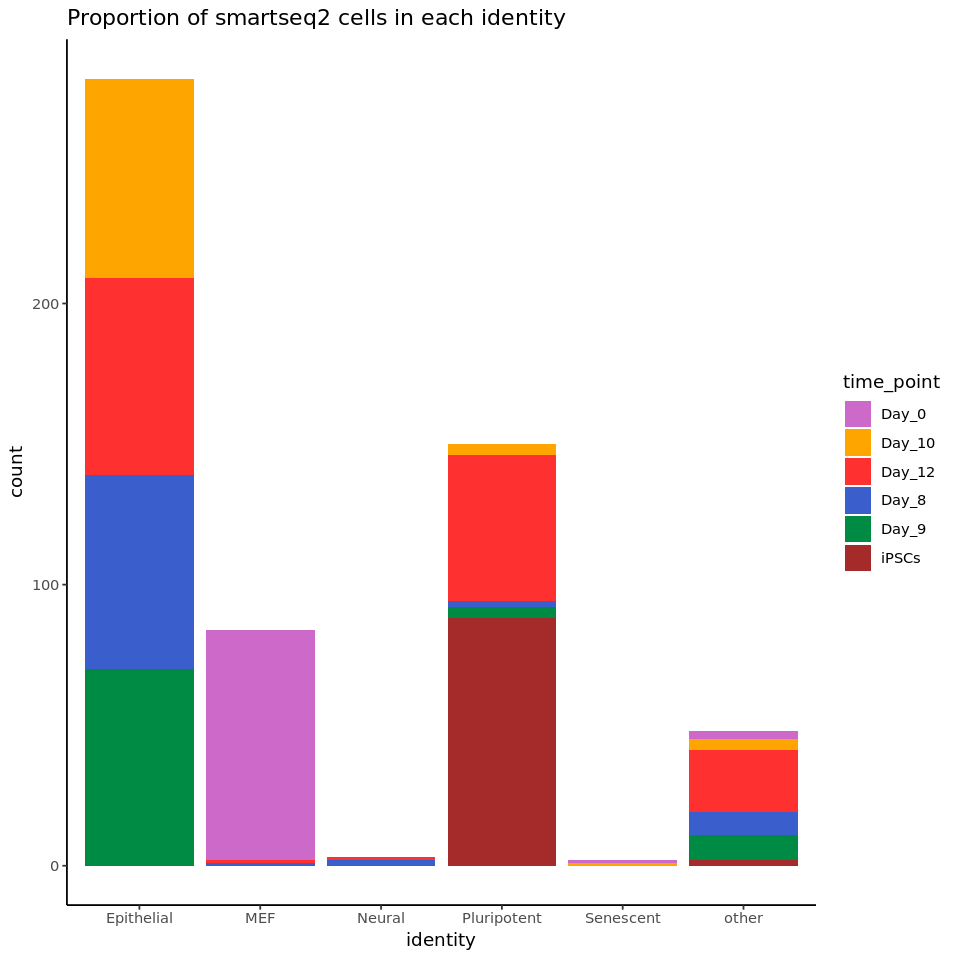

In [60]:
ident_proportions_bar <- schieb_smart_tenx_integrated@meta.data %>%
                            filter(project == "smartseq") %>%
                            group_by(project, time_point,identity) %>%
                            ggplot(., aes(x = identity,  fill = time_point)) + 
                                        geom_bar(position = "stack") +
                                        scale_fill_manual(values = c("orchid3","orange","firebrick1","royalblue3","springgreen4","brown")) + theme_classic() +
                                        ggtitle("Proportion of smartseq2 cells in each identity")

ident_proportions_bar

In [61]:
pdf("Schiebinger_integration/schieb_smart_tenx_integrated_Idents_prop_bar.pdf", useDingbats = FALSE)
ident_proportions_bar
dev.off()

png 
  2